#Installation & Libraries

In [ ]:
 !pip install pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 25.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27079 sha256=e9bc5275a0e3b9a3fba2b137d7257c883e48742f6c33bee165fa5ab90b97352c
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordc

In [ ]:
import io
import re
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_profiling as pp
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib.colors import ListedColormap
import warnings

from sklearn import preprocessing
from sklearn.model_selection import train_test_split,cross_val_score, learning_curve
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,BaggingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, f1_score, accuracy_score, precision_score, recall_score
from sklearn.feature_selection import SelectKBest, mutual_info_classif, VarianceThreshold, chi2, f_classif, SequentialFeatureSelector,RFECV,RFE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.base import clone
from sklearn.datasets import make_moons
from scipy.stats import norm, skew
from sklearn.inspection import permutation_importance


from imblearn import FunctionSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.pipeline import make_pipeline

warnings.filterwarnings('ignore')

<ipython-input-2-ef80306f5f6e>:7: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


In [ ]:
headersList = ['Id', 'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
              'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
              'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
              'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25',
              'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40',
              'Cover_Type']


In [ ]:
from google.colab import files
#Uploade train dataset
train_upload = files.upload()

Saving training_dataset.csv to training_dataset.csv


In [ ]:
train_DataSet = pd.read_csv(io.BytesIO(train_upload['training_dataset.csv']),header=0 ,names=headersList)
#train_DataSet

In [ ]:
#Uploade test dataset
valid_upload = files.upload()

Saving validation_dataset.csv to validation_dataset.csv


In [ ]:
validuation_DataSet = pd.read_csv(io.BytesIO(valid_upload['validation_dataset.csv']), header=0, names=headersList)
#validuation_DataSet

In [ ]:
#Uploade test dataset
test_upload = files.upload()

Saving test_dataset.csv to test_dataset.csv


In [ ]:
test_DataSet = pd.read_csv(io.BytesIO(test_upload['test_dataset.csv']), header=0, names=headersList)
#test_DataSet

# Required Functions

In [ ]:
def combine_Wilderness_Area_columns(dataset):
  # Combine two binary columns into a new categorical column
  dataset['Wilderness_Area'] = dataset['Wilderness_Area1'].astype(str) + dataset['Wilderness_Area2'].astype(str) + dataset['Wilderness_Area3'].astype(str)+dataset['Wilderness_Area4'].astype(str)

  #Check if any row has 1 in more than 1 column of these 4 columns [Wilderness_Area1 , Wilderness_Area2 , Wilderness_Area3 , Wilderness_Area4]
  excluded_values = set(['0010', '0100', '1000','0001'])
  # Filter the DataFrame to get the values outside the specified ones
  result = dataset[~dataset['Wilderness_Area'].isin(excluded_values)]
  # Print the resulting DataFrame
  len(result)


  # Replace the combined values with meaningful categories (optional)
  dataset['Wilderness_Area'] = dataset['Wilderness_Area'].replace({
      '0001': 'Wilderness_Area4',
      '0010': 'Wilderness_Area3',
      '0100': 'Wilderness_Area2',
      '1000': 'Wilderness_Area1'
  })
  dataset = dataset.drop(columns=['Wilderness_Area1', 'Wilderness_Area2','Wilderness_Area3','Wilderness_Area4'])

  # Return Dataset
  return dataset


In [ ]:
def combine_Soil_Type_columns(dataset):
  # Combine two binary columns into a new categorical column
  soil_type_columns = []
  # Loop through the range of column numbers (1 to 40)
  for i in range(1, 40 + 1):
      column_name = f'Soil_Type{i}'
      soil_type_columns.append(column_name)

  # Concatenate all Soil_Type columns into a new column 'Soil_Type'
  dataset['Soil_Type'] = dataset[soil_type_columns].astype(str).agg(''.join, axis=1)

  # Find the position of '1' in the string
  for i in range(len(dataset)):
    position_of_1 = dataset['Soil_Type'][i].find('1')

    # Replace the entire string with "column+position number"
    dataset['Soil_Type'][i] = f"Soil_Type{position_of_1 + 1}"
  for i in range(40):
    dataset = dataset.drop(columns=[f"Soil_Type{i + 1}"])
  # Return Dataset
  return dataset



# Feature Engineering

In [ ]:
train_DataSet=combine_Wilderness_Area_columns(train_DataSet)

In [ ]:
train_DataSet = train_DataSet.drop(columns=['Id'])

In [ ]:
train_DataSet=combine_Soil_Type_columns(train_DataSet)

In [ ]:
validuation_DataSet=combine_Wilderness_Area_columns(validuation_DataSet)

In [ ]:
validuation_DataSet = validuation_DataSet.drop(columns=['Id'])

In [ ]:
validuation_DataSet=combine_Soil_Type_columns(validuation_DataSet)

In [ ]:
test_DataSet=combine_Wilderness_Area_columns(test_DataSet)

In [ ]:
test_DataSet = test_DataSet.drop(columns=['Id'])

In [ ]:
test_DataSet=combine_Soil_Type_columns(test_DataSet)

In [ ]:
train_DataSet

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type,Wilderness_Area,Soil_Type
0,2976,85,23,95,72,2436,246,193,64,836,1,Wilderness_Area3,Soil_Type22
1,3104,233,12,150,40,1503,200,251,186,1129,1,Wilderness_Area3,Soil_Type23
2,3385,160,7,937,204,1224,228,242,147,752,1,Wilderness_Area2,Soil_Type31
3,3191,41,14,210,37,3207,221,208,119,865,1,Wilderness_Area3,Soil_Type32
4,2821,297,4,85,1,992,208,238,169,242,1,Wilderness_Area3,Soil_Type23
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8281,3294,328,13,624,192,3506,188,224,175,3583,7,Wilderness_Area3,Soil_Type40
8282,3390,24,6,216,13,3332,217,226,146,2226,7,Wilderness_Area1,Soil_Type37
8283,3350,100,18,175,-26,2121,247,212,88,3322,7,Wilderness_Area1,Soil_Type38
8284,3727,5,17,984,318,4934,195,204,143,3092,7,Wilderness_Area3,Soil_Type40


In [ ]:
validuation_DataSet

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type,Wilderness_Area,Soil_Type
0,2432,147,16,90,2,484,240,236,120,1385,6,Wilderness_Area4,Soil_Type6
1,2653,114,14,175,38,2278,244,225,107,2345,3,Wilderness_Area3,Soil_Type10
2,3542,315,31,255,130,3218,124,198,206,1448,1,Wilderness_Area1,Soil_Type40
3,3191,286,20,30,12,4965,162,235,212,781,1,Wilderness_Area1,Soil_Type23
4,2160,64,37,190,96,240,225,140,15,484,3,Wilderness_Area4,Soil_Type1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1493,2062,75,12,0,0,420,234,217,113,691,4,Wilderness_Area4,Soil_Type10
1494,2926,67,12,324,45,3055,232,217,116,2093,2,Wilderness_Area1,Soil_Type29
1495,2595,98,19,190,0,1883,248,209,81,2010,6,Wilderness_Area3,Soil_Type11
1496,2820,257,15,127,23,2496,183,248,202,702,2,Wilderness_Area3,Soil_Type13


In [ ]:
test_DataSet

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Cover_Type,Wilderness_Area,Soil_Type
0,2823,104,20,573,191,2608,249,210,80,1940,3,Wilderness_Area3,Soil_Type10
1,2453,157,7,474,183,806,228,241,146,920,3,Wilderness_Area4,Soil_Type6
2,3156,110,6,162,24,1101,230,234,138,1758,1,Wilderness_Area3,Soil_Type23
3,2471,186,16,175,67,972,221,250,157,1332,3,Wilderness_Area3,Soil_Type3
4,2292,177,29,443,152,1315,219,242,134,797,4,Wilderness_Area4,Soil_Type3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1520,2850,99,23,67,18,4909,250,201,65,124,1,Wilderness_Area1,Soil_Type30
1521,2562,58,22,85,26,331,230,187,79,1624,6,Wilderness_Area3,Soil_Type10
1522,2784,88,12,180,-2,510,238,220,112,295,5,Wilderness_Area1,Soil_Type30
1523,2343,184,14,361,232,912,223,249,156,421,4,Wilderness_Area4,Soil_Type6


#Slide 2: Dataset’s overview (EDA)

## Data Preprossing

In [ ]:
pp.ProfileReport(train_DataSet)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train_DataSet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8286 entries, 0 to 8285
Data columns (total 13 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Elevation                           8286 non-null   int64 
 1   Aspect                              8286 non-null   int64 
 2   Slope                               8286 non-null   int64 
 3   Horizontal_Distance_To_Hydrology    8286 non-null   int64 
 4   Vertical_Distance_To_Hydrology      8286 non-null   int64 
 5   Horizontal_Distance_To_Roadways     8286 non-null   int64 
 6   Hillshade_9am                       8286 non-null   int64 
 7   Hillshade_Noon                      8286 non-null   int64 
 8   Hillshade_3pm                       8286 non-null   int64 
 9   Horizontal_Distance_To_Fire_Points  8286 non-null   int64 
 10  Cover_Type                          8286 non-null   int64 
 11  Wilderness_Area                     8286 non-null   obje

In [ ]:
#counts unique values in each column dataset
train_DataSet.nunique()

Elevation                             1580
Aspect                                 361
Slope                                   50
Horizontal_Distance_To_Hydrology       362
Vertical_Distance_To_Hydrology         383
Horizontal_Distance_To_Roadways       2443
Hillshade_9am                          168
Hillshade_Noon                         132
Hillshade_3pm                          243
Horizontal_Distance_To_Fire_Points    2115
Cover_Type                               7
Wilderness_Area                          4
Soil_Type                               38
dtype: int64

In [ ]:
print(train_DataSet.describe())

         Elevation       Aspect        Slope  \
count  8286.000000  8286.000000  8286.000000   
mean   2732.983104   155.366643    16.868694   
std     432.906958   108.392758     8.514811   
min    1863.000000     0.000000     0.000000   
25%    2350.000000    66.000000    10.000000   
50%    2720.500000   125.000000    16.000000   
75%    3099.750000   252.000000    23.000000   
max    3849.000000   360.000000    50.000000   

       Horizontal_Distance_To_Hydrology  Vertical_Distance_To_Hydrology  \
count                       8286.000000                     8286.000000   
mean                         225.249698                       53.233888   
std                          213.670866                       62.890107   
min                            0.000000                     -134.000000   
25%                           60.000000                        5.000000   
50%                          175.000000                       34.000000   
75%                          323.000000   

In [ ]:
print(train_DataSet.skew())
# Values close to 0 show less skew
# Several attributes in Soil_Type show a large skew. Hence, some algos may benefit if skew is corrected

Elevation                             0.231034
Aspect                                0.486825
Slope                                 0.481654
Horizontal_Distance_To_Hydrology      1.563164
Vertical_Distance_To_Hydrology        1.489166
Horizontal_Distance_To_Roadways       1.287637
Hillshade_9am                        -1.134396
Hillshade_Noon                       -0.922196
Hillshade_3pm                        -0.311391
Horizontal_Distance_To_Fire_Points    1.597119
Cover_Type                           -0.158200
dtype: float64


### Checking for Null values

In [ ]:
# Checking whether null values are present
train_DataSet.isnull().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Cover_Type                            0
Wilderness_Area                       0
Soil_Type                             0
dtype: int64

### Checking for Duplicate Rows

In [ ]:
# Check for duplicate rows across all columns
print("Number of Duplicate Rows:", train_DataSet.duplicated().sum())

Number of Duplicate Rows: 0


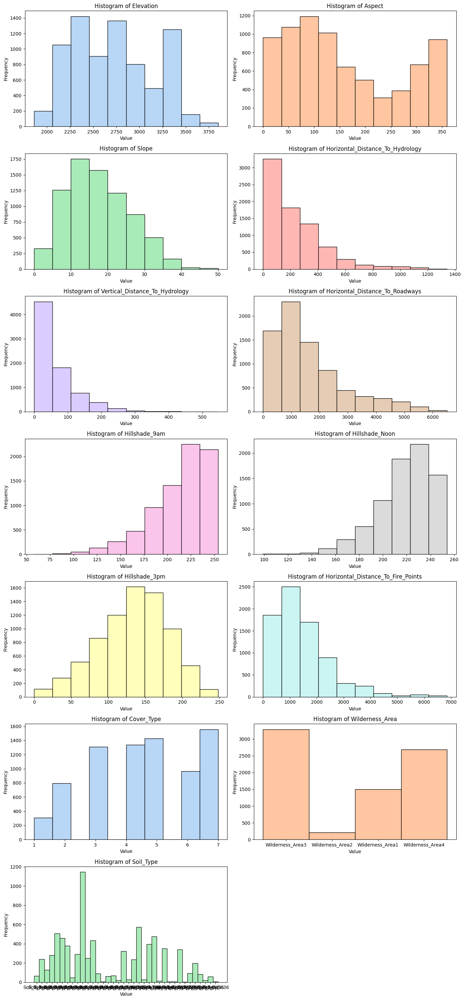

In [ ]:
df = train_DataSet.loc[(train_DataSet['Vertical_Distance_To_Hydrology'] >= 0)]

# Create the pastel color palette with 12 colors (7x2 grid)
pastel_palette = sns.color_palette('pastel', n_colors=len(df.columns))

# Set up the 4x3 subplot grid
fig, axes = plt.subplots(7, 2, figsize=(14, 30))

for i, column in enumerate(df.columns):
    # Determine the position in the 7x2 grid
    row = i // 2
    col = i % 2

    # Create a histogram on the current subplot
    sns.histplot(df[column], bins=10, color=pastel_palette[i], ax=axes[row, col])

    # Set title, xlabel, and ylabel for the current subplot
    axes[row, col].set_title(f'Histogram of {column}')
    axes[row, col].set_xlabel('Value')
    axes[row, col].set_ylabel('Frequency')


# Remove the last unused subplot
if len(df.columns) % 2 != 0:
    axes[-1, -1].remove()
# Adjust layout and show the plot
plt.tight_layout()
plt.show()


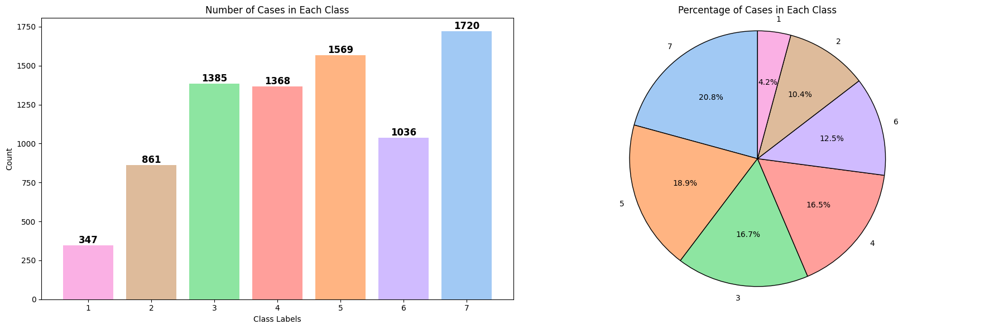

In [ ]:
# Count the number of cases for each class
class_counts = train_DataSet['Cover_Type'].value_counts()
class_labels = class_counts.index.tolist()
class_values = class_counts.tolist()

pastel_palette = sns.color_palette('pastel', n_colors=7)


fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Plot the bar chart on the first subplot (axes[0])
bars = axes[0].bar(class_labels, class_values, color=pastel_palette)
for bar in bars:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width() / 2, height, str(height),
                 ha='center', va='bottom', fontweight='bold', fontsize=12)

axes[0].set_title('Number of Cases in Each Class')
axes[0].set_xlabel('Class Labels')
axes[0].set_ylabel('Count')


# Create a pie chart on the second subplot (axes[1])
axes[1].pie(class_values, labels=class_labels, autopct='%1.1f%%', startangle=90, colors=pastel_palette,
            wedgeprops={'edgecolor': 'black', 'linewidth': 1, 'antialiased': True})
axes[1].set_title('Percentage of Cases in Each Class')
axes[1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Adjust the layout and display the plots
plt.tight_layout()
plt.show()


### Corrlation Matrix between all features

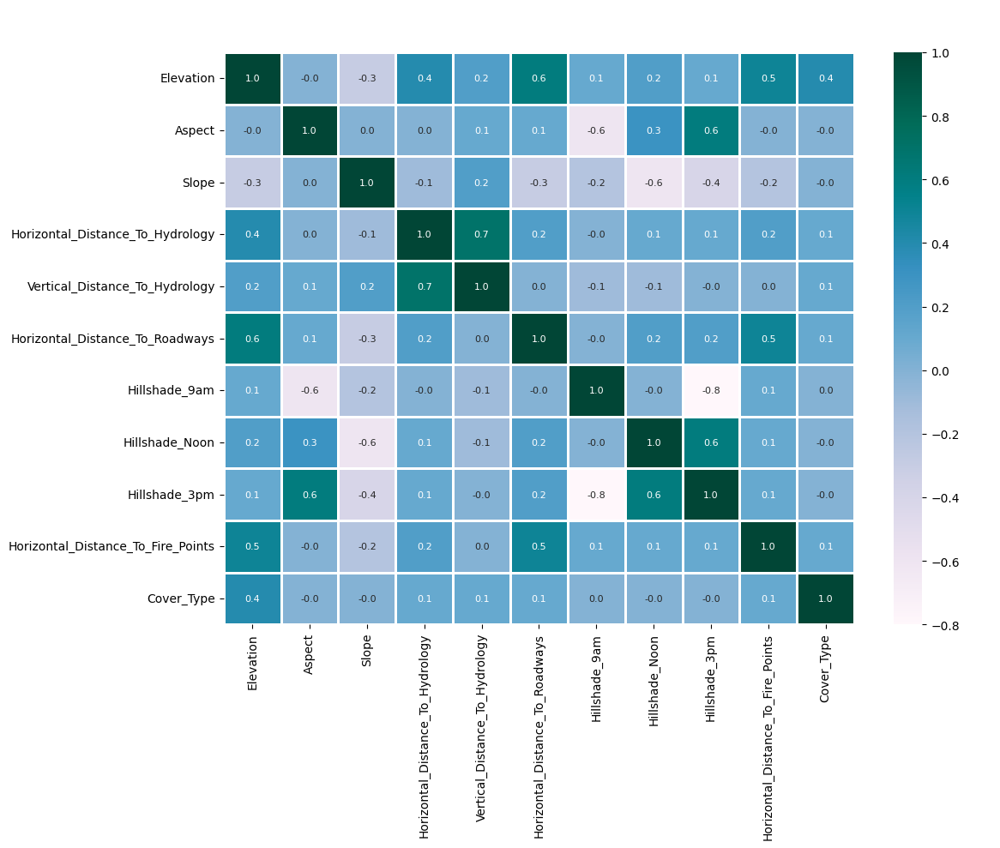

In [ ]:
# Calculate the correlation matrix
corr = train_DataSet.corr().round(1)
plt.figure(figsize=(12,10 ))

# Plot the correlation heatmap
ax = sns.heatmap(corr, annot=True, cmap='PuBuGn', fmt='.1f', linewidths=1, annot_kws={"size": 8})
plt.title("Forest Cover Type- Correlation Heatmap", color="white", size=38)
plt.tight_layout()
plt.show()


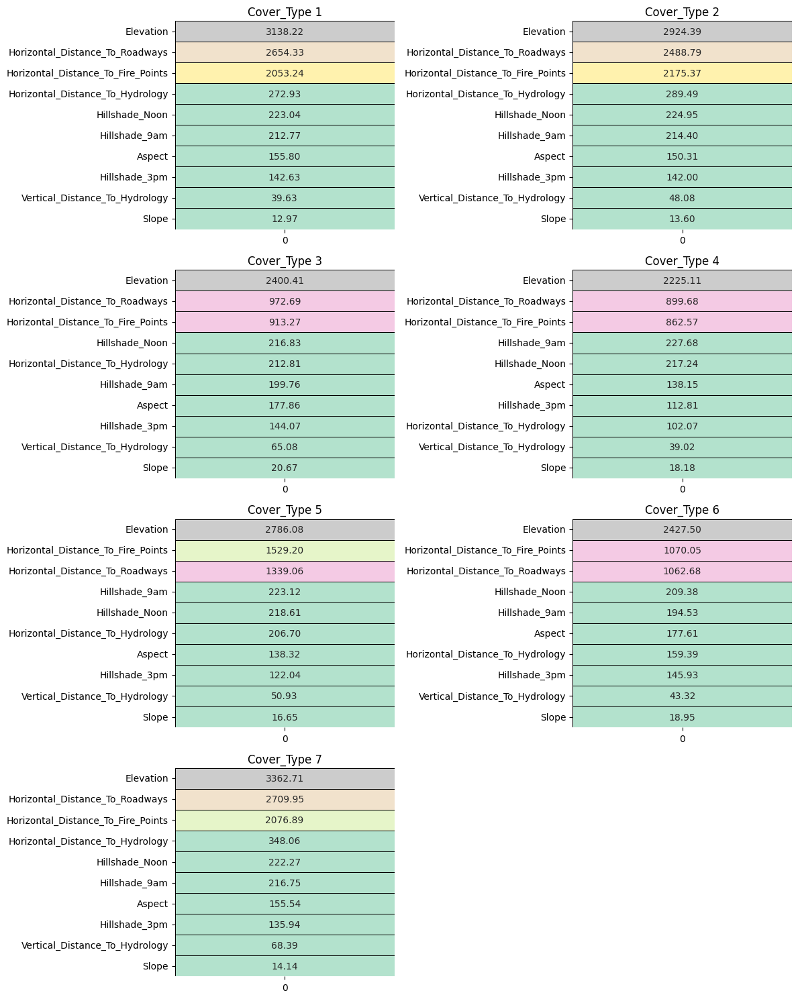

In [ ]:
# Exclude unnecessary columns
exclude_columns = ['Soil_Type', 'Cover_Type', 'Wilderness_Area']
included_columns = [col for col in train_DataSet.columns if col not in exclude_columns]

# Sort the mean values for each cover type in descending order
sorted_means = {cover_type: train_DataSet[train_DataSet['Cover_Type'] == cover_type][included_columns].mean().sort_values(ascending=False) for cover_type in range(1, 8)}

# Set up the 4x2 subplot grid
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 15))

# Plot each cover type's heatmap in a separate subplot
for i, cover_type in enumerate(sorted_means.keys()):
    row = i // 2
    col = i % 2

    # Create a heatmap on the current subplot
    sns.heatmap(sorted_means[cover_type].to_frame(), annot=True, cmap='Pastel2', linewidths=0.4, linecolor='black', cbar=False, fmt='.2f', ax=axes[row, col])

    # Set the title for the current subplot
    axes[row, col].set_title(f'Cover_Type {cover_type}')

# Remove the last unused subplot
if len(sorted_means) % 2 != 0:
    axes[-1, -1].remove()

plt.tight_layout()
plt.show()


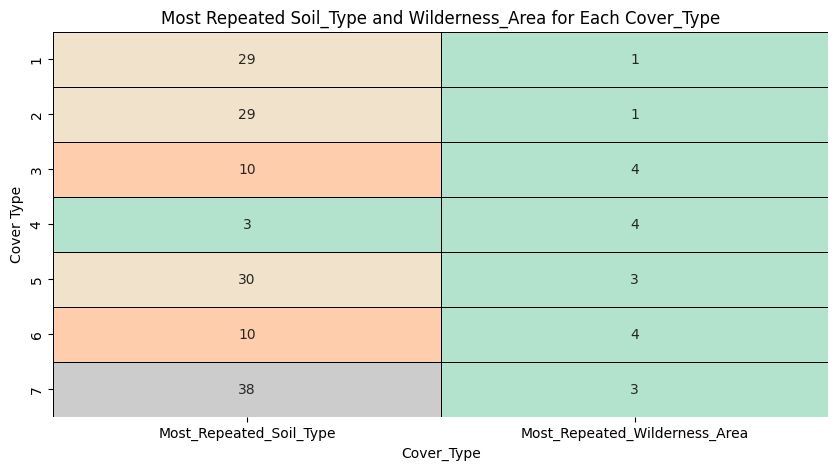

In [ ]:
# Helper function to find the most repeated value in a series
def get_most_repeated_value(series):
    return series.value_counts().idxmax()

# Get the most repeated 'Soil_Type' for each cover type
most_repeated_soil_type = {cover_type: get_most_repeated_value(train_DataSet[train_DataSet['Cover_Type'] == cover_type]['Soil_Type']) for cover_type in range(1, 8)}

# Get the most repeated 'Wilderness_Area' for each cover type
most_repeated_wilderness_area = {cover_type: get_most_repeated_value(train_DataSet[train_DataSet['Cover_Type'] == cover_type]['Wilderness_Area']) for cover_type in range(1, 8)}

# Create a DataFrame with the most repeated values for each cover type
most_repeated_data = pd.DataFrame({
    'Most_Repeated_Soil_Type': [int(soil_type.replace('Soil_Type', '')) for soil_type in most_repeated_soil_type.values()],
    'Most_Repeated_Wilderness_Area': [int(wilderness_area.replace('Wilderness_Area', '')) for wilderness_area in most_repeated_wilderness_area.values()]
}, index=most_repeated_soil_type.keys())

# Create the heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(most_repeated_data, annot=True, cmap='Pastel2', linewidths=0.4, linecolor='black', cbar=False, fmt='d')
plt.title("Most Repeated Soil_Type and Wilderness_Area for Each Cover_Type")
plt.xlabel("Cover_Type")
plt.ylabel("Cover Type")
plt.show()


## Separate features and target variable for Training & Validuation & Testing set

In [ ]:
# Separate features and target variable for training set
label_encoder = LabelEncoder()

# Fit and transform the categorical data to numerical labels
train_DataSet['Wilderness_Area'] = label_encoder.fit_transform(train_DataSet['Wilderness_Area'] )
train_DataSet['Soil_Type'] = label_encoder.fit_transform(train_DataSet['Soil_Type'] )
x_train = train_DataSet.drop(columns=['Cover_Type'])
y_train = train_DataSet['Cover_Type']

validuation_DataSet['Wilderness_Area'] = label_encoder.fit_transform(validuation_DataSet['Wilderness_Area'] )
validuation_DataSet['Soil_Type'] = label_encoder.fit_transform(validuation_DataSet['Soil_Type'] )
# Separate features and target variable for validaton set
x_valid = validuation_DataSet.drop(columns=['Cover_Type'])
y_valid = validuation_DataSet['Cover_Type']

test_DataSet['Wilderness_Area'] = label_encoder.fit_transform(test_DataSet['Wilderness_Area'] )
test_DataSet['Soil_Type'] = label_encoder.fit_transform(test_DataSet['Soil_Type'] )
# Separate features and target variable for test set
x_test = test_DataSet.drop(columns=['Cover_Type'])
y_test = test_DataSet['Cover_Type']



#Slide 4: Visualize the training and test set to understand problem nature (T-SNE)

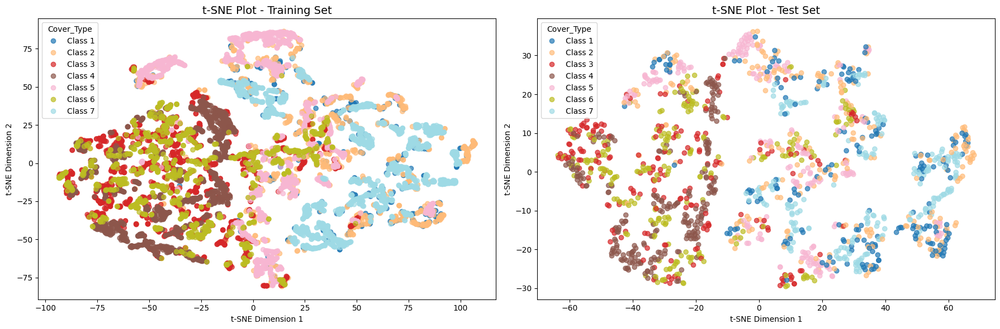

In [ ]:
# Create a colormap for the classes
cmap = plt.get_cmap('tab20')

# Assuming the classes are represented by integers 1 to 7
classes = {1: "Class 1", 2: "Class 2", 3: "Class 3", 4: "Class 4", 5: "Class 5", 6: "Class 6", 7: "Class 7"}

# Create a t-SNE object with perplexity and learning rate parameters
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200)

x_train_tsne = tsne.fit_transform(x_train)
x_test_tsne = tsne.fit_transform(x_test)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot t-SNE scatter plot for training set
sc1 = ax1.scatter(x_train_tsne[:, 0], x_train_tsne[:, 1], c=y_train, cmap=cmap, alpha=0.7)
ax1.set_title("t-SNE Plot - Training Set", fontsize=14)
ax1.set_xlabel("t-SNE Dimension 1")
ax1.set_ylabel("t-SNE Dimension 2")
ax1.axis('tight')

# Plot t-SNE scatter plot for test set
sc2 = ax2.scatter(x_test_tsne[:, 0], x_test_tsne[:, 1], c=y_test, cmap=cmap, alpha=0.7)
ax2.set_title("t-SNE Plot - Test Set", fontsize=14)
ax2.set_xlabel("t-SNE Dimension 1")
ax2.set_ylabel("t-SNE Dimension 2")
ax2.axis('tight')

# Extract integer class labels from LaTeX expressions
pattern = re.compile(r"\d+")
labels = sc1.legend_elements()[1]
class_labels = [int(pattern.findall(label)[0]) for label in labels]

# Add legend for the training set plot
ax1.legend(handles=sc1.legend_elements()[0], labels=[classes[label] for label in class_labels], title='Cover_Type', loc='upper left')

# Extract integer class labels from LaTeX expressions for the test set plot
labels = sc2.legend_elements()[1]
class_labels = [int(pattern.findall(label)[0]) for label in labels]

# Add legend for the test set plot
ax2.legend(handles=sc2.legend_elements()[0], labels=[classes[label] for label in class_labels], title='Cover_Type', loc='upper left')

plt.tight_layout()
plt.show()


##PCA

In [ ]:
# #After Appling PCA
# pca = PCA(n_components=8)
# x_train = pca.fit_transform(x_train)
# x_test = pca.transform(x_test)

#Q1) Obtain a baseline performance

## Apply Models

In [ ]:
pastel_palette = sns.color_palette('pastel')
model_results = {}
classifiers_scorces = {}

def Classifiers(classifier_name, X_Train, Y_Train, X_Test, Y_Test):
    val_results = {}
    # Classifiers: K Nearest Neighbors,Logistic Regression, Support Vector Machine,Decision Tree Classifier, , Gaussian Naive Bayes, Bernoulli Naive Bayes

    classifiers = {
        "K Nearest Neighbors": KNeighborsClassifier(),
        "Logistic Regression": LogisticRegression(max_iter=8000,random_state=42),
        "Support Vector Machine SVM": SVC(kernel='linear', decision_function_shape='ovr', C=1),
        "Decision Tree Classifier": DecisionTreeClassifier(random_state=42),
        "Gaussian Naive Bayes": GaussianNB()
    }

    for clf_name, clf in classifiers.items():
      if(classifier_name== clf_name):
          print(f"{clf_name}")

          clf_model = clf.fit(X_Train, Y_Train)
          y_test_pred = clf_model.predict(X_Test)
          y_train_pred = clf_model.predict(X_Train)
          ##############################################################################################################
          # Confusion Matrix for Training and Testing
          cm_train = confusion_matrix(Y_Train, y_train_pred)
          cm_test = confusion_matrix(Y_Test, y_test_pred)

          # Visualize the confusion matrices using Seaborn
          fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

          sns.heatmap(cm_train, annot=True, cmap='Pastel2', ax=axs[0], fmt='g')
          axs[0].set_title(f"{clf_name} Training Confusion Matrix")
          axs[0].set_xlabel('Predicted Labels')
          axs[0].set_ylabel('Actual Labels')

          sns.heatmap(cm_test, annot=True, cmap='Pastel1', ax=axs[1], fmt='g')
          axs[1].set_title(f"{clf_name} Testing Confusion Matrix")
          axs[1].set_xlabel('Predicted Labels')
          axs[1].set_ylabel('Actual Labels')

          plt.tight_layout()
          plt.show()
          print("------------------------------------------------------------------------------------------------------")
          ##############################################################################################################

          # Classification Report for Training and Testing
          clf_report_Train = classification_report(Y_Train, y_train_pred)
          print(f"{clf_name} Training Classification Report:\n{clf_report_Train}")
          print("------------------------------------------------------------------------------------------------------")


          clf_report_Test = classification_report(Y_Test, y_test_pred)
          print(f"{clf_name} Testing Classification Report:\n{clf_report_Test}")
          print("------------------------------------------------------------------------------------------------------")

          ##############################################################################################################
          # Performance Metrics for Training and Testing
          acc_train = accuracy_score(Y_Train, y_train_pred) * 100
          pre_train = precision_score(Y_Train, y_train_pred, average='macro') * 100
          recall_train = recall_score(Y_Train, y_train_pred, average='macro') * 100
          f1_train = f1_score(Y_Train, y_train_pred, average='macro') * 100

          # Create DataFrame for training metrics
          metrics_train = pd.DataFrame({'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 score'],
                                        'Value': [acc_train, pre_train, recall_train, f1_train]})

          acc_test = accuracy_score(Y_Test, y_test_pred) * 100
          pre_test = precision_score(Y_Test, y_test_pred, average='macro') * 100
          recall_test = recall_score(Y_Test, y_test_pred, average='macro') * 100
          f1_test = f1_score(Y_Test, y_test_pred, average='macro') * 100

          # Create DataFrame for testing metrics
          metrics_test = pd.DataFrame({'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 score'],
                                      'Value': [acc_test, pre_test, recall_test, f1_test]})

          classifiers_scorces[clf_name] = [acc_test, pre_test, recall_test, f1_test]

          fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

          sns.barplot(x='Metric', y='Value', data=metrics_train, ax=axs[0], palette=pastel_palette)
          axs[0].set_title(f"{clf_name} Training Performance Metrics")
          axs[0].set_ylim(10, 100)  # Set Y-axis range from 10 to 100%
          axs[0].set_ylabel('Percentage (%)')

          for i, v in enumerate(metrics_train['Value']):
             axs[0].text(i, v + 1, f"{v:.1f}%", ha='center', va='bottom', fontweight='bold', fontsize=12)

          sns.barplot(x='Metric', y='Value', data=metrics_test, ax=axs[1], palette=pastel_palette)
          axs[1].set_title(f"{clf_name} Testing Performance Metrics")
          axs[1].set_ylim(10, 100)  # Set Y-axis range from 10 to 100%
          axs[1].set_ylabel('Percentage (%)')

          for i, v in enumerate(metrics_test['Value']):
              axs[1].text(i, v + 1,f"{v:.1f}%", ha='center', va='bottom', fontweight='bold', fontsize=12)

          plt.tight_layout()
          plt.show()

    ##############################################################################################################


K Nearest Neighbors


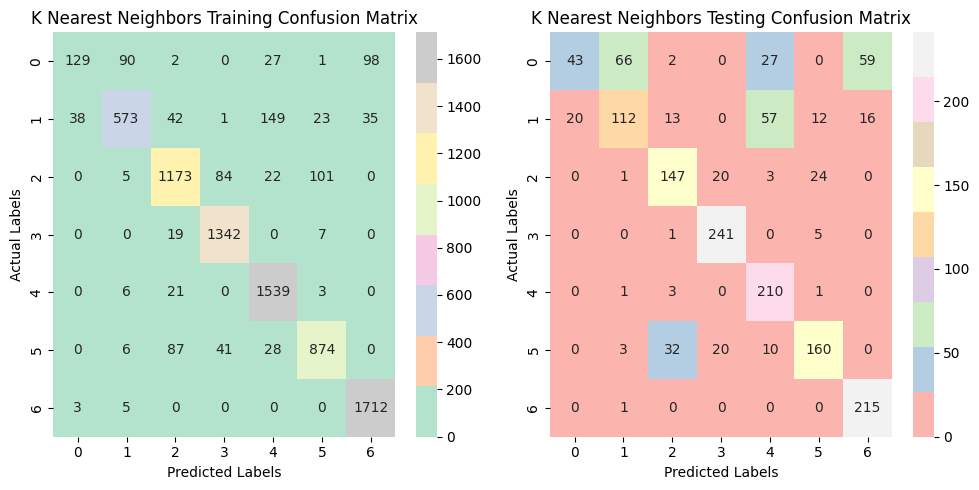

------------------------------------------------------------------------------------------------------
K Nearest Neighbors Training Classification Report:
              precision    recall  f1-score   support

           1       0.76      0.37      0.50       347
           2       0.84      0.67      0.74       861
           3       0.87      0.85      0.86      1385
           4       0.91      0.98      0.95      1368
           5       0.87      0.98      0.92      1569
           6       0.87      0.84      0.85      1036
           7       0.93      1.00      0.96      1720

    accuracy                           0.89      8286
   macro avg       0.86      0.81      0.83      8286
weighted avg       0.88      0.89      0.88      8286

------------------------------------------------------------------------------------------------------
K Nearest Neighbors Testing Classification Report:
              precision    recall  f1-score   support

           1       0.68      0.22      

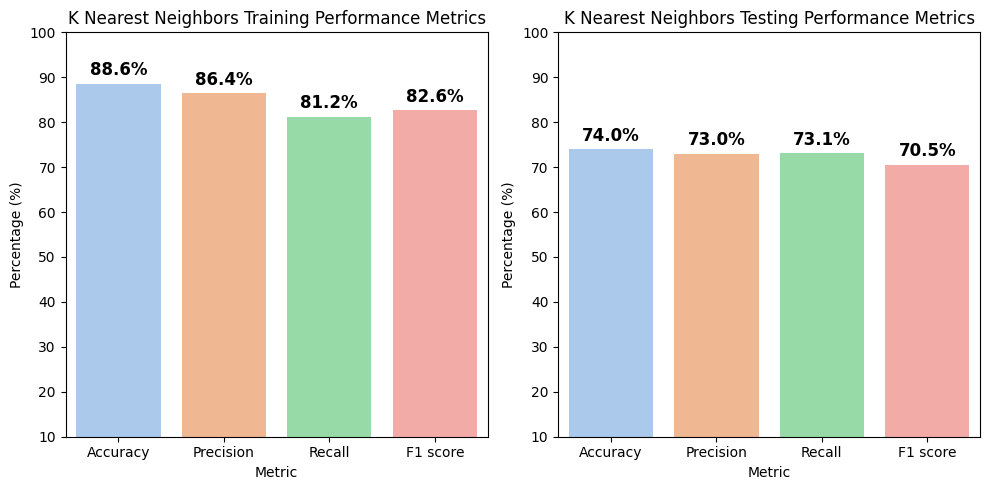

In [ ]:
Classifiers("K Nearest Neighbors",x_train,y_train, x_test, y_test)

Logistic Regression


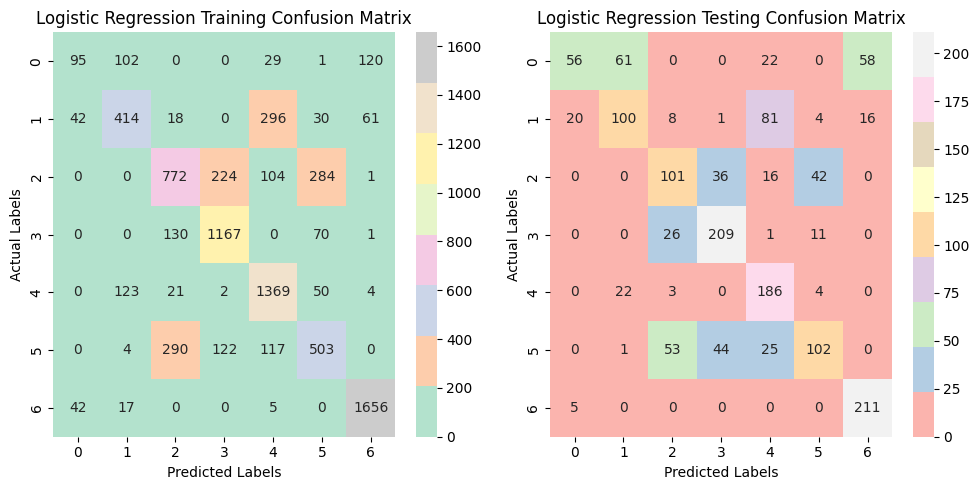

------------------------------------------------------------------------------------------------------
Logistic Regression Training Classification Report:
              precision    recall  f1-score   support

           1       0.53      0.27      0.36       347
           2       0.63      0.48      0.54       861
           3       0.63      0.56      0.59      1385
           4       0.77      0.85      0.81      1368
           5       0.71      0.87      0.78      1569
           6       0.54      0.49      0.51      1036
           7       0.90      0.96      0.93      1720

    accuracy                           0.72      8286
   macro avg       0.67      0.64      0.65      8286
weighted avg       0.71      0.72      0.71      8286

------------------------------------------------------------------------------------------------------
Logistic Regression Testing Classification Report:
              precision    recall  f1-score   support

           1       0.69      0.28      

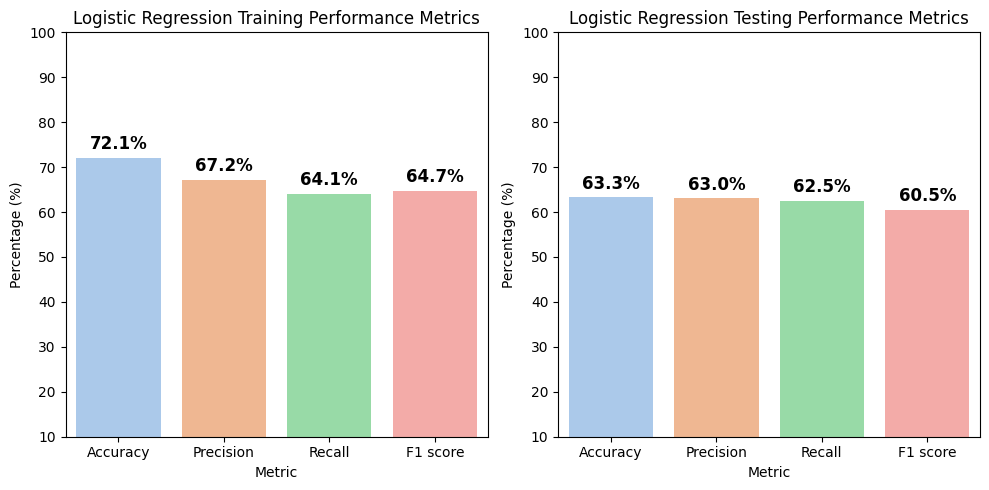

In [ ]:
Classifiers( "Logistic Regression",x_train, y_train, x_test, y_test)

Gaussian Naive Bayes


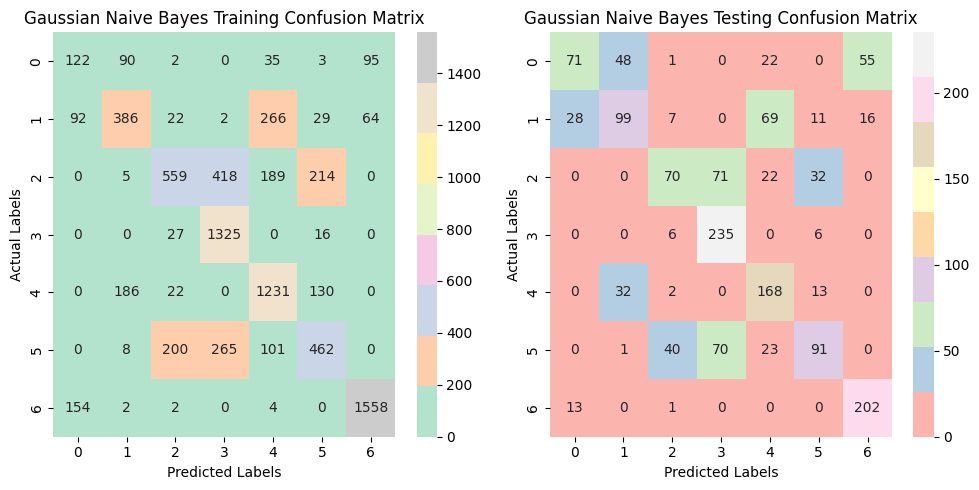

------------------------------------------------------------------------------------------------------
Gaussian Naive Bayes Training Classification Report:
              precision    recall  f1-score   support

           1       0.33      0.35      0.34       347
           2       0.57      0.45      0.50       861
           3       0.67      0.40      0.50      1385
           4       0.66      0.97      0.78      1368
           5       0.67      0.78      0.73      1569
           6       0.54      0.45      0.49      1036
           7       0.91      0.91      0.91      1720

    accuracy                           0.68      8286
   macro avg       0.62      0.62      0.61      8286
weighted avg       0.68      0.68      0.67      8286

------------------------------------------------------------------------------------------------------
Gaussian Naive Bayes Testing Classification Report:
              precision    recall  f1-score   support

           1       0.63      0.36    

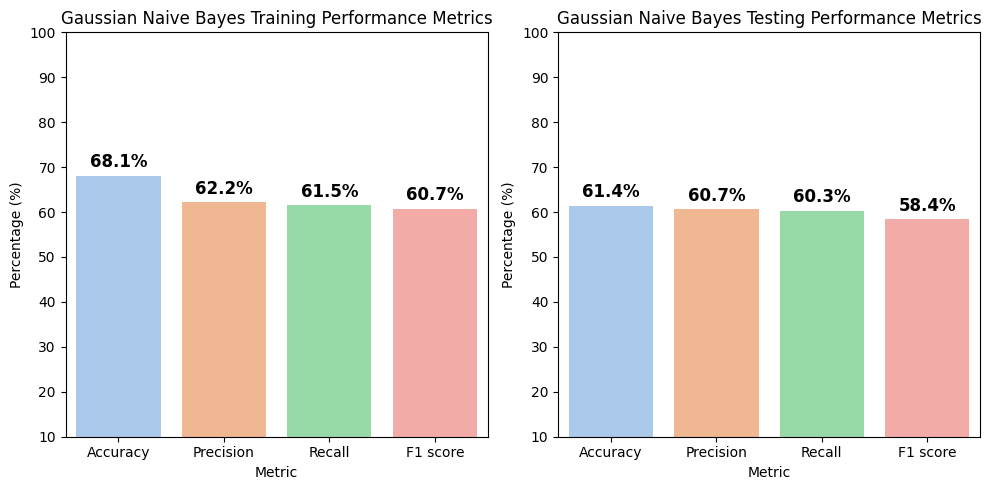

In [ ]:
Classifiers("Gaussian Naive Bayes",x_train,y_train, x_test, y_test)

Support Vector Machine SVM


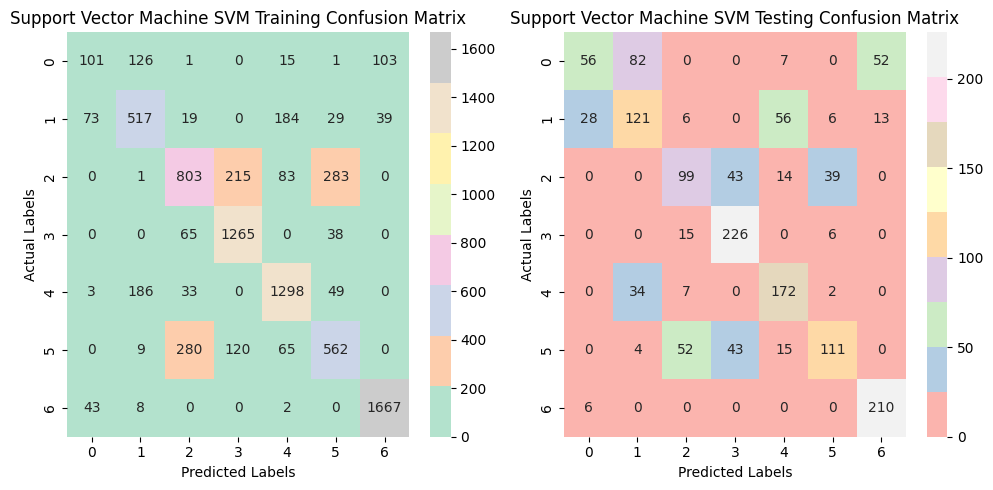

------------------------------------------------------------------------------------------------------
Support Vector Machine SVM Training Classification Report:
              precision    recall  f1-score   support

           1       0.46      0.29      0.36       347
           2       0.61      0.60      0.61       861
           3       0.67      0.58      0.62      1385
           4       0.79      0.92      0.85      1368
           5       0.79      0.83      0.81      1569
           6       0.58      0.54      0.56      1036
           7       0.92      0.97      0.94      1720

    accuracy                           0.75      8286
   macro avg       0.69      0.68      0.68      8286
weighted avg       0.74      0.75      0.74      8286

------------------------------------------------------------------------------------------------------
Support Vector Machine SVM Testing Classification Report:
              precision    recall  f1-score   support

           1       0.62  

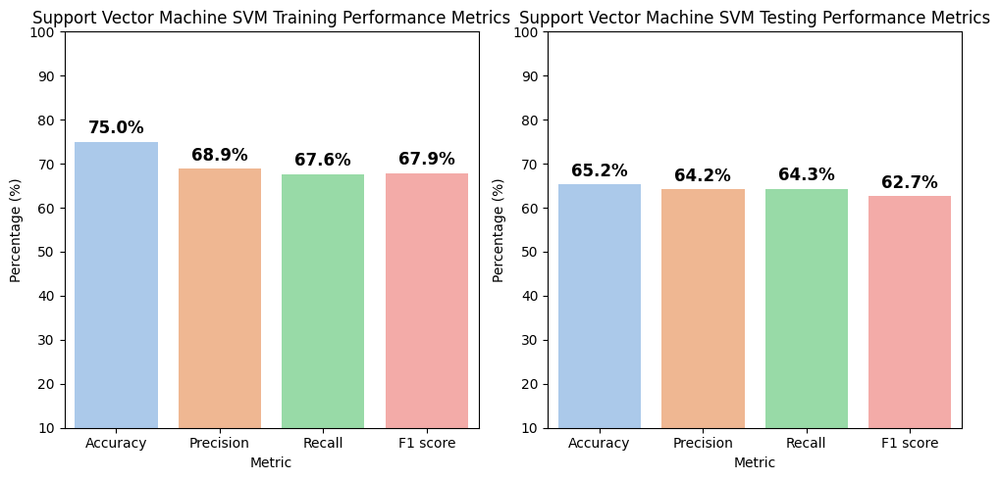

In [ ]:
Classifiers("Support Vector Machine SVM",x_train, y_train, x_test, y_test)

Decision Tree Classifier


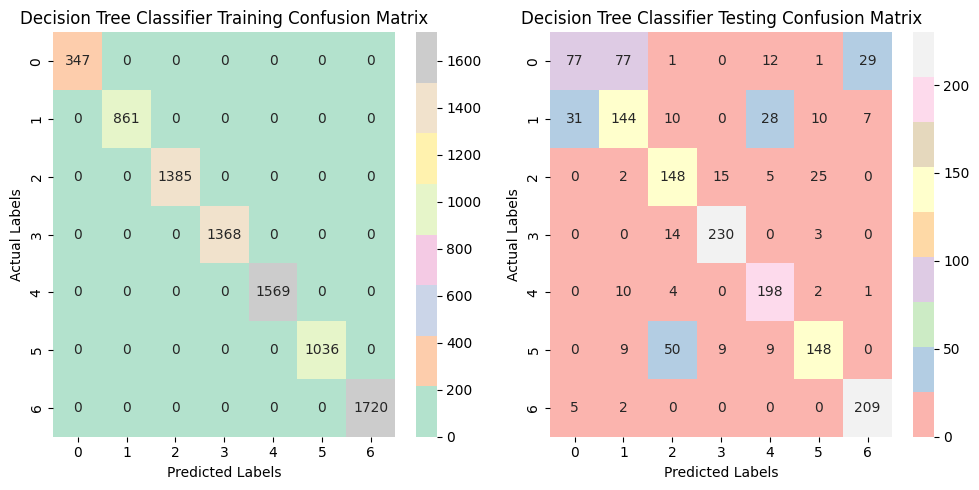

------------------------------------------------------------------------------------------------------
Decision Tree Classifier Training Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       347
           2       1.00      1.00      1.00       861
           3       1.00      1.00      1.00      1385
           4       1.00      1.00      1.00      1368
           5       1.00      1.00      1.00      1569
           6       1.00      1.00      1.00      1036
           7       1.00      1.00      1.00      1720

    accuracy                           1.00      8286
   macro avg       1.00      1.00      1.00      8286
weighted avg       1.00      1.00      1.00      8286

------------------------------------------------------------------------------------------------------
Decision Tree Classifier Testing Classification Report:
              precision    recall  f1-score   support

           1       0.68      

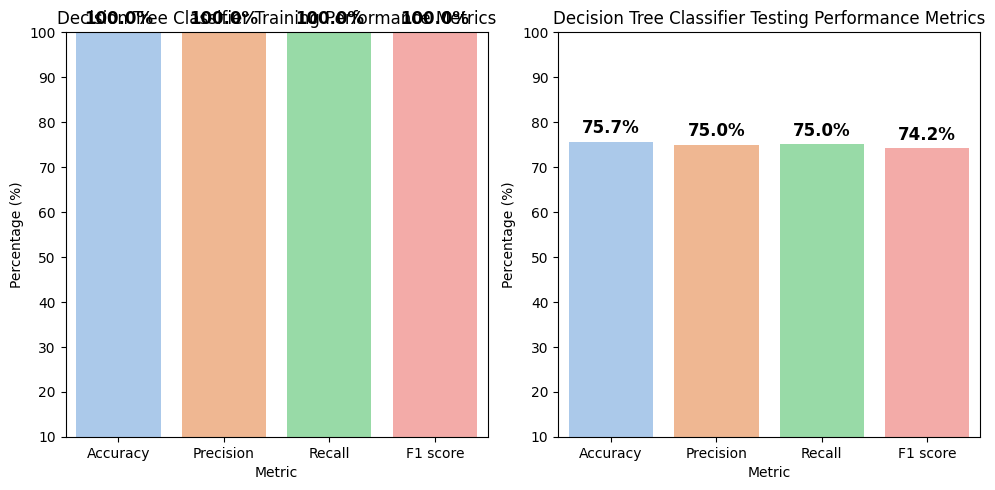

In [ ]:
Classifiers("Decision Tree Classifier",x_train, y_train, x_test, y_test)

In [ ]:
#Model Evlations
metrics_df = pd.DataFrame(classifiers_scorces, index=['Accuracy', 'Precision', 'Recall', 'F1 score']).T
metrics_df_sorted = metrics_df.sort_values(by='F1 score', ascending=False)
column_order = ['Accuracy'] + [col for col in metrics_df_sorted.columns if col != 'Accuracy']

# Then, reindex the DataFrame with the specified column order
metrics_df_sorted = metrics_df_sorted.reindex(columns=column_order)
metrics_df_sorted.style.background_gradient(cmap='Blues')

,Accuracy,Precision,Recall,F1 score
Decision Tree Classifier,75.672131,74.963580,75.048556,74.166544
K Nearest Neighbors,73.967213,72.982978,73.114442,70.523100
Support Vector Machine SVM,65.245902,64.195847,64.265408,62.661385
Logistic Regression,63.278689,63.033901,62.549294,60.529876
Gaussian Naive Bayes,61.377049,60.677703,60.317960,58.381810


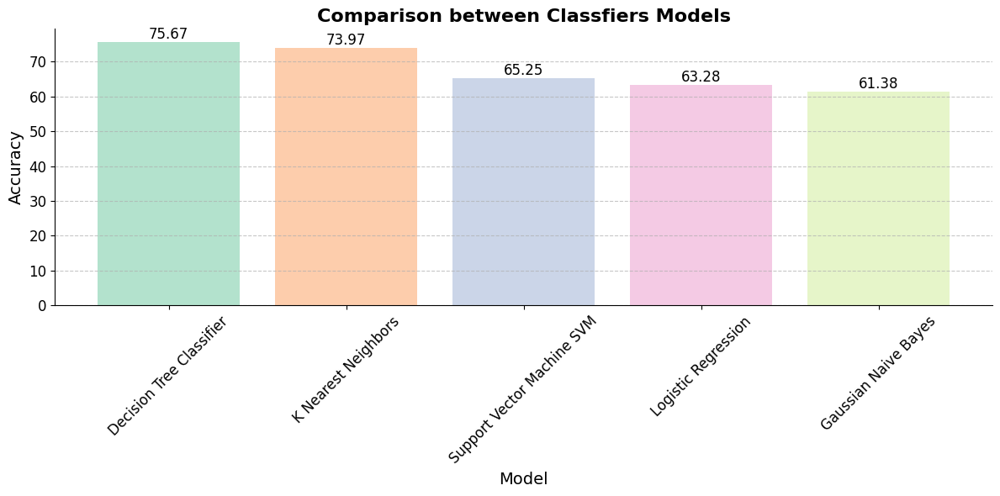

In [ ]:
# Extract the first value from each list
values = [classifiers_scorces[key][0] for key in classifiers_scorces]

# Extract the labels (names of the models)
labels = list(classifiers_scorces.keys())

# Sort the values and labels in descending order based on accuracy
sorted_indices = sorted(range(len(values)), key=lambda k: values[k], reverse=True)
values = [values[i] for i in sorted_indices]
labels = [labels[i] for i in sorted_indices]


# Plot the bar chart
plt.figure(figsize=(12, 6))  # Adjust the figure size for better visualization
bars = plt.bar(labels, values, color=plt.cm.Pastel2.colors)

# Customize plot aesthetics
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('Comparison between Classfiers Models', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Add data labels to the bars
for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{value:.2f}', ha='center', va='bottom', fontsize=12)

# Remove top and right spines, and set gridlines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()  # Adjust the spacing to prevent clipping of labels
plt.show()


# Q2) First Improvement strategy : Comparing dimensionality reduction to feature selection

## a) Fliter Selection methods

### Required Function For Selection Methods

### Information gain or Mutual Information

In [ ]:
knn = {'Mutual Information': set() ,'Variance Threshold': set() ,'Chi-Square': set() ,'Feacture Selection': set(), "Forward Feature Elimination":set() , "Backward Feature Elimination":set() , "Recursive Feature Elimination":set()}
DT = {'Mutual Information': set() ,'Variance Threshold': set() ,'Chi-Square': set() ,'Feacture Selection': set(), "Forward Feature Elimination":set() , "Backward Feature Elimination":set() , "Recursive Feature Elimination":set()}

In [ ]:
def tsne (X,Y,title_name):
  cmap = plt.get_cmap('tab20')
  #T-SNE Visualization on Training Dataset
  tsne = TSNE(n_components=2 , perplexity=30, learning_rate=200)
  X_tsne = tsne.fit_transform(X)

  # Create a scatter plot of the embedded points
  scatter_plot=sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1],c=Y, cmap=cmap, alpha=0.7)
  #scatter_plot.legend(labels=['Legitimate','Fake'])

  plt.title(title_name)
  plt.show()

In [ ]:
def Baseline (Train_x, Test_x,Range):
  Baseline_Knn_Scores ={}
  Baseline_DT_Scores= {}
  for i in Range:
     #Before Apllying Dimensionality Reduction
     Baseline_Knn_Scores[i],Baseline_DT_Scores[i]= Accuracy_Score(Train_x, y_train, Test_x, y_test)
  return  Baseline_Knn_Scores,Baseline_DT_Scores

In [ ]:
def Accuracy_Score(X_Train,Y_Train,X_Test,Y_Test):

  knn_clf =KNeighborsClassifier()
  knn_clf.fit(X_Train,Y_Train)
  y_knn_pred = knn_clf.predict(X_Test)
  knn_score = accuracy_score(Y_Test, y_knn_pred) * 100

  #Decision Tree Classifier
  DT_clf =DecisionTreeClassifier(random_state=42)
  DT_clf.fit(X_Train, Y_Train)
  y_DT_pred =DT_clf.predict(X_Test)
  DT_score = accuracy_score(Y_Test, y_knn_pred) * 100

  return knn_score , DT_score

In [ ]:
def Feature_Select(X_train, y_train, X_test, y_test, FSM, model):
  fs = FSM
  fs.fit(X_train, y_train)
  X_train_new = fs.transform(X_train)
  X_test_new = fs.transform(X_test)
  model.fit(X_train_new, y_train)
  y_pred = model.predict(X_test_new)
  acc = accuracy_score(y_test, y_pred) * 100

  return acc

In [ ]:
#Filter Methods Function
def Fliter_DR(train_X, train_Y, test_X, test_Y ,fm,fm_name):

  knn_Accuracy_Score_FS= {}
  DT_Accuracy_Score_FS = {}

  for i in range(2, 13):

    #apply fliter reducation
    if fm_name == 'Variance Threshold':
      fsm = VarianceThreshold(threshold=i)

    else:
      fsm =  SelectKBest(fm, k=i)

    knn_Accuracy_Score_FS[i] =  Feature_Select (train_X, train_Y, test_X, test_Y, fsm,KNeighborsClassifier())
    DT_Accuracy_Score_FS[i] =  Feature_Select (train_X, train_Y, test_X, test_Y, fsm,DecisionTreeClassifier(random_state=42))

    knn[fm_name].add((i, knn_Accuracy_Score_FS[i]))
    DT[fm_name].add((i, DT_Accuracy_Score_FS[i]))

  return knn_Accuracy_Score_FS,DT_Accuracy_Score_FS

In [ ]:
def Max (knn_Scores ,DT_Scores,knn_name, DT_name):

    # Find the maximum X score for Naive Bayes
    max_knn = max(knn_Scores.values())
    best_knn= max(knn_Scores, key=knn_Scores.get)
    print()
    print(f"Maximum of {knn_name}: {max_knn}")
    print(f"Best number of n_components {knn_name}: {best_knn}")
    print()

    # Find the maximum X score for K-Nearest Neighbors
    max_DT = max(DT_Scores.values())
    best_DT = max(DT_Scores, key=DT_Scores.get)
    print(f"Maximum of {DT_name}:",max_DT )
    print(f"Best number of n_components {DT_name}:", best_DT)
    print()

    return best_knn,max_knn,best_DT,max_DT

In [ ]:
def draw_plots(knn_Scores ,DT_Scores,Baseline_knn_Scores,Baseline_DT_Scores,knn_name, DT_name,RD_range,RD_label):

    RD_range_=RD_range

    best_knn,max_knn,best_DT,max_DT=Max(knn_Scores ,DT_Scores,knn_name, DT_name)

    # Create figure and axes
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].grid()
    axs[0].plot(RD_range_, knn_Scores.values(),'bx-', label=RD_label ,color='Purple')
    axs[0].set_xticks(RD_range_)

    # Plot the maximum X score point in black
    axs[0].plot(best_knn, max_knn, marker='o', markersize=8, color='black')
    # Plot the X score for Naive Bayes with actual features
    axs[0].plot(RD_range_, Baseline_knn_Scores.values(), label='Baseline', linestyle='--',color='y')

    axs[0].legend()
    axs[0].set_xlabel('Number of Components')
    axs[0].set_ylabel('Accuracy Scores')
    axs[0].set_title(knn_name)

    axs[1].grid()
    axs[1].plot(RD_range_, DT_Scores.values(),'bx-',  label=RD_label ,color='Purple')

    # Plot the maximum X score point in black
    axs[1].plot(best_DT, max_DT, marker='o', markersize=8, color='black')
    # Plot the X score for K-Nearest Neighbors with actual features
    axs[1].plot(RD_range_, Baseline_DT_Scores.values(), label='Baseline', linestyle='--',color='y')
    axs[1].set_xticks(RD_range_)

    axs[1].legend()
    axs[1].set_xlabel('Number of Components')
    axs[1].set_ylabel('Accuracy Scores')
    axs[1].set_title(DT_name)
    plt.show()

    return best_knn,max_knn,best_DT,max_DT


Maximum of K Nearest Neighbors: 73.96721311475409
Best number of n_components K Nearest Neighbors: 12

Maximum of Decision Tree Classifier: 76.65573770491804
Best number of n_components Decision Tree Classifier: 8



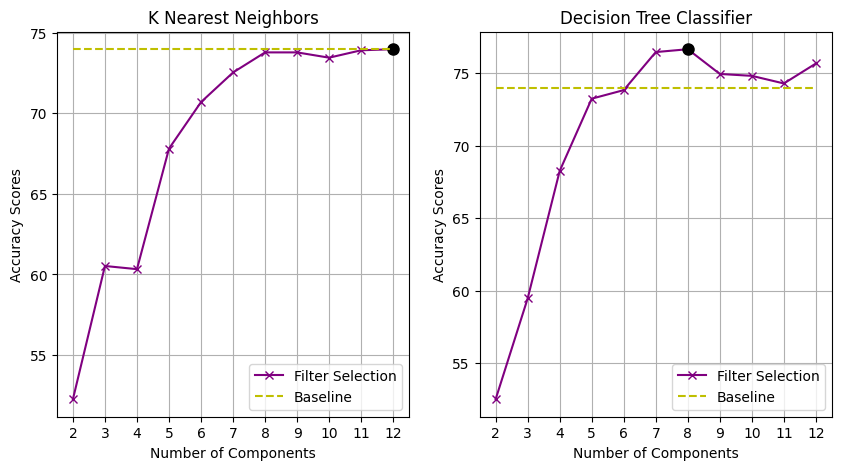

In [ ]:
Baseline_knn_Scores,Baseline_DT_Scores=Baseline (x_train,x_test,range(2,13))
knn_Accuracy_Scores_MI,DT_Accuracy_Scores_MI= Fliter_DR(x_train, y_train,x_test, y_test,mutual_info_classif,'Mutual Information')
IG_knn_N, IG_knn_value, IG_DT_N ,IG_DT_value =draw_plots(knn_Accuracy_Scores_MI,DT_Accuracy_Scores_MI,Baseline_knn_Scores,Baseline_DT_Scores,'Information-Gain K-Nearest Neighbors','Information-Gain Decision Tree Classifier',range(2, 13),'Filter Selection')

### Variance Threshold


Maximum of Variance Threshold K Nearest Neighbors: 73.90163934426229
Best number of n_components Variance Threshold K Nearest Neighbors: 2

Maximum of Variance Threshold Decision Tree Classifier: 74.68852459016392
Best number of n_components Variance Threshold Decision Tree Classifier: 2



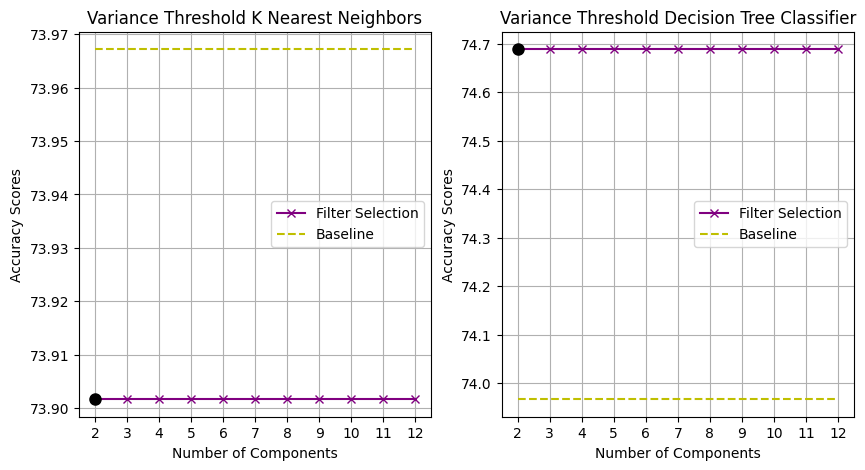

In [ ]:
Baseline_knn_Scores,Baseline_DT_Scores=Baseline (x_train,x_test,range(2,13))
knn_Accuracy_Scores_VT,DT_Accuracy_Scores_VT= Fliter_DR(x_train, y_train,x_test, y_test,mutual_info_classif,'Variance Threshold')
VT_knn_N, VT_knn_value, VT_DT_N ,VT_DT_value =draw_plots(knn_Accuracy_Scores_VT,DT_Accuracy_Scores_VT,Baseline_knn_Scores,Baseline_DT_Scores,'Variance Threshold K Nearest Neighbors','Variance Threshold Decision Tree Classifier',range(2, 13),'Filter Selection')

### Chi-Square


Maximum of Chi-Square-K-Nearest Neighbors: 74.36065573770492
Best number of n_components Chi-Square-K-Nearest Neighbors: 10

Maximum of Chi-Square-Decision Tree Classifier: 76.65573770491804
Best number of n_components Chi-Square-Decision Tree Classifier: 8



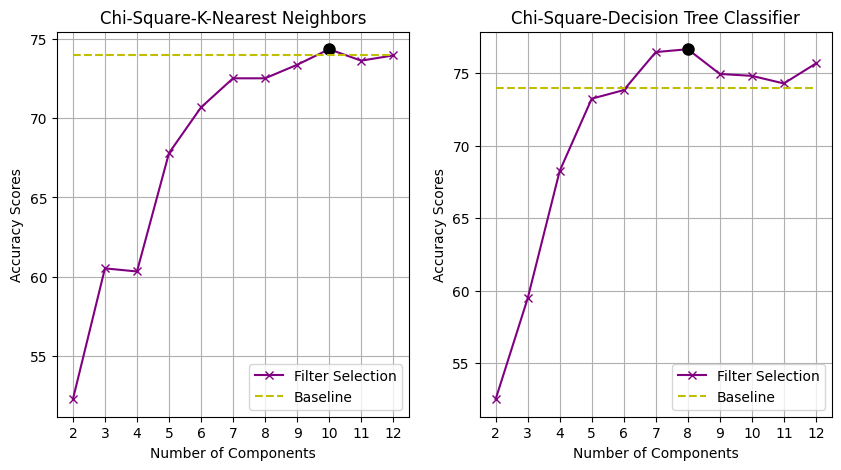

In [ ]:
Baseline_knn_Scores,Baseline_DT_Scores=Baseline (x_train,x_test,range(2,13))
knn_Accuracy_Scores_chi2,DT_Accuracy_Scores_chi2= Fliter_DR(x_train, y_train,x_test, y_test,mutual_info_classif,'Chi-Square')
CS_knn_N, CS_knn_value, CS_DT_N ,CS_DT_value =draw_plots(knn_Accuracy_Scores_chi2,DT_Accuracy_Scores_chi2,Baseline_knn_Scores,Baseline_DT_Scores,'Chi-Square-K-Nearest Neighbors','Chi-Square-Decision Tree Classifier',range(2, 13),'Filter Selection')

### Feature Selection


Maximum of Feature Selection-K-Nearest Neighbors: 73.96721311475409
Best number of n_components Feature Selection-K-Nearest Neighbors: 12

Maximum of Feature Selection-Decision Tree Classifier: 76.65573770491804
Best number of n_components Feature Selection-Decision Tree Classifier: 8



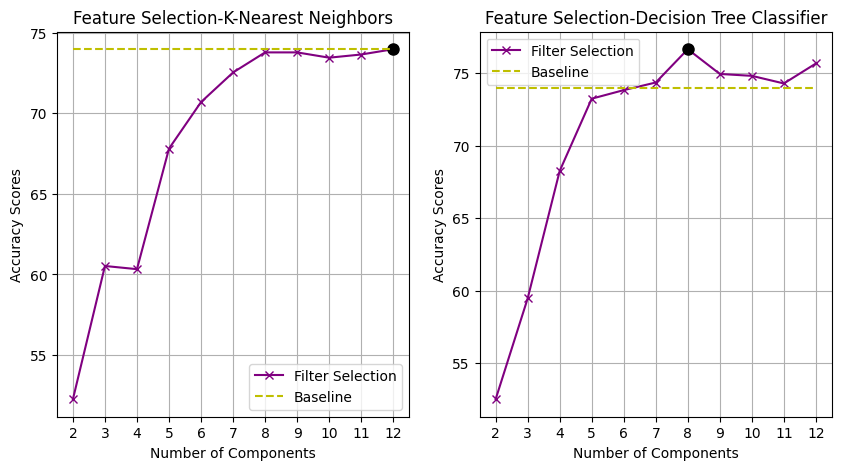

In [ ]:
Baseline_knn_Scores,Baseline_DT_Scores=Baseline (x_train,x_test,range(2,13))
knn_Accuracy_Scores_FS,DT_Accuracy_Scores_FS= Fliter_DR(x_train, y_train,x_test, y_test,mutual_info_classif,'Feacture Selection')
FS_knn_N, FS_knn_value, FS_DT_N ,FS_DT_value =draw_plots(knn_Accuracy_Scores_FS,DT_Accuracy_Scores_FS,Baseline_knn_Scores,Baseline_DT_Scores,'Feature Selection-K-Nearest Neighbors','Feature Selection-Decision Tree Classifier',range(2, 13),'Filter Selection')

## b) Wrapper Selection methods

In [ ]:
#Filter Methods Function
def Wrapper_DR(train_X, train_Y, test_X, test_Y,w_name,d ):

  knn_W_Accuracy_Scores = {}
  DT_W_Accuracy_Scores = {}
  for i in range(2,13):

    #KNN
    # Sequential Feature Selector
    knn_estimator = KNeighborsClassifier()
    knn_sfs = SequentialFeatureSelector(knn_estimator, n_features_to_select='auto', direction= d, scoring='accuracy')
    knn_X_selected = knn_sfs.fit_transform(train_X, train_Y)

    # Train a model using the selected features
    knn_estimator.fit(knn_X_selected, train_Y)
    knn_X_test_selected = knn_sfs.transform(test_X)
    knn_predictions = knn_estimator.predict(knn_X_test_selected)

    # Calculate the accuracy_score
    knn_W_Accuracy_Scores[i]=accuracy_score(test_Y, knn_predictions)*100

    #DecisionTree
    # Sequential Feature Selector
    DT_estimator = DecisionTreeClassifier(random_state=42)
    DT_sfs = SequentialFeatureSelector(DT_estimator, n_features_to_select='auto', direction= d, scoring='accuracy')
    DT_X_selected = DT_sfs.fit_transform(train_X, train_Y)

    # Train a model using the selected features
    DT_estimator.fit(DT_X_selected, train_Y)
    DT_X_test_selected = DT_sfs.transform(test_X)
    DT_predictions = DT_estimator.predict(DT_X_test_selected)

    # Calculate the accuracy_score
    DT_W_Accuracy_Scores[i]=accuracy_score(test_Y, DT_predictions)*100

    knn[w_name].add((i, knn_W_Accuracy_Scores[i]))
    DT[w_name].add((i, DT_W_Accuracy_Scores[i]))

  return knn_W_Accuracy_Scores, DT_W_Accuracy_Scores

### Forward Feature Elimination


Maximum of Forward_FE-K Nearest Neighbors: 72.06557377049181
Best number of n_components Forward_FE-K Nearest Neighbors: 2

Maximum of Forward_FE-Decision Tree Classifier: 74.29508196721312
Best number of n_components Forward_FE-Decision Tree Classifier: 2



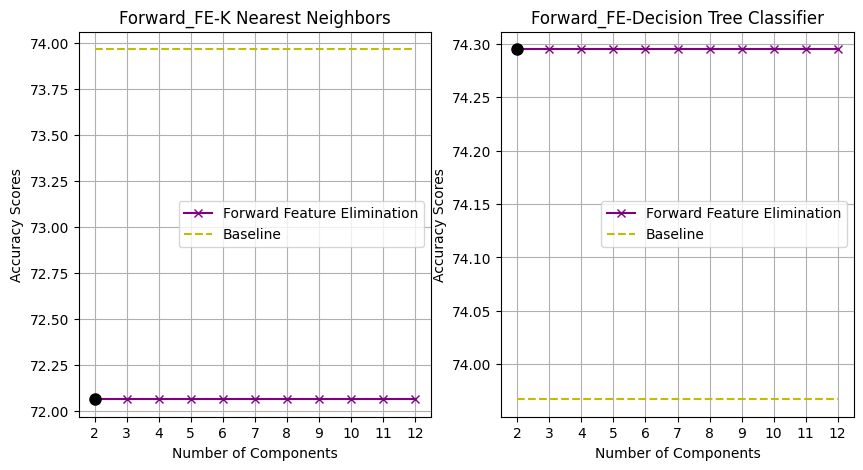

In [ ]:
Baseline_knn_Scores,Baseline_DT_Scores=Baseline (x_train,x_test,range(2,13))
knn_W_Accuracy_Scores, DT_W_Accuracy_Scores = Wrapper_DR(x_train, y_train, x_test, y_test, "Forward Feature Elimination", 'forward')
FW_knn_N, FW_knn_value, FW_DT_N ,FW_DT_value=draw_plots( knn_W_Accuracy_Scores, DT_W_Accuracy_Scores,Baseline_knn_Scores,Baseline_DT_Scores, 'Forward_FE-K Nearest Neighbors', 'Forward_FE-Decision Tree Classifier', range(2, 13), 'Forward Feature Elimination')

### Back Feature Elimination


Maximum of Backward_FE-K Nearest Neighbors: 73.18032786885246
Best number of n_components Backward_FE-K Nearest Neighbors: 2

Maximum of Backward_FE-Decision Tree Classifier: 74.29508196721312
Best number of n_components Backward_FE-Decision Tree Classifier: 2



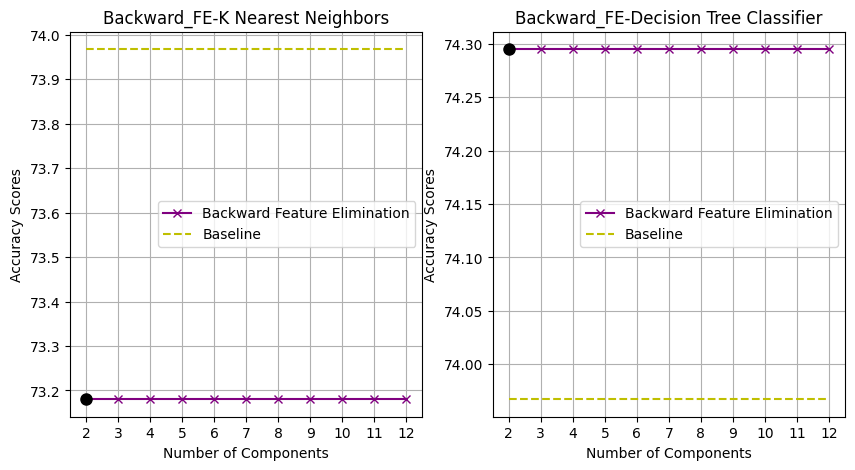

In [ ]:
Baseline_knn_Scores,Baseline_DT_Scores=Baseline (x_train,x_test,range(2,13))
knn_W_Accuracy_Scores, DT_W_Accuracy_Scores = Wrapper_DR(x_train, y_train, x_test, y_test, "Backward Feature Elimination",'backward')
BW_knn_N, BW_knn_value, BW_DT_N ,BW_DT_value=draw_plots( knn_W_Accuracy_Scores, DT_W_Accuracy_Scores,Baseline_knn_Scores,Baseline_DT_Scores, 'Backward_FE-K Nearest Neighbors', 'Backward_FE-Decision Tree Classifier', range(2, 13), 'Backward Feature Elimination')


### Recursive Feature Elimination

In [ ]:
def compute_permutation_importances(classifier, X, y, scoring='accuracy', n_repeats=10, random_state=0):
    result = permutation_importance(classifier, X, y, scoring=scoring, n_repeats=n_repeats, random_state=random_state)
    return np.array(result.importances_mean)

In [ ]:
knn_RFE_Accuracy_Scores = {}
DT_RFE_Accuracy_Scores= {}

def Recursive_DR(train_X, train_Y, test_X, test_Y ):

  for i in range(2,13):

    #K-Nearest Neighbor(KNN)
    knn_clf_rfe = KNeighborsClassifier()
    knn_clf_rfe.fit(train_X.iloc[:, :i], train_Y)
    knn_permutation_importances =compute_permutation_importances(knn_clf_rfe, test_X.iloc[:, :i], test_Y)

    # Apply Recursive Feature Elimination (RFE) with NB classifier and permutation importances
    rfe_knn = RFE(estimator=knn_clf_rfe, n_features_to_select=i, importance_getter=lambda _: knn_permutation_importances)
    X_train_rfe = rfe_knn.fit_transform(train_X, train_Y)
    X_test_rfe = rfe_knn.transform(test_X)

    # Train and predict using NB classifier with RFE-selected features
    knn_clf_rfe.fit(X_train_rfe, train_Y)
    knn_predictions = knn_clf_rfe.predict(X_test_rfe)
    knn_RFE_Accuracy_Scores[i]= accuracy_score(test_Y, knn_predictions)*100

    #Decision Tree Classifier
    DT_clf_rfe =DecisionTreeClassifier(random_state=42)
    DT_clf_rfe.fit(train_X.iloc[:, :i], train_Y)
    DT_permutation_importances = compute_permutation_importances(DT_clf_rfe, test_X.iloc[:, :i], test_Y)

    # Apply Recursive Feature Elimination (RFE) with NB classifier and permutation importances
    rfe_DT = RFE(estimator=DT_clf_rfe, n_features_to_select=i, importance_getter=lambda _: DT_permutation_importances)
    X_train_rfe = rfe_DT.fit_transform(train_X, train_Y)
    X_test_rfe = rfe_DT.transform(test_X)

    # Train and predict using NB classifier with RFE-selected features
    DT_clf_rfe.fit(X_train_rfe,train_Y)
    DT_predictions = DT_clf_rfe.predict(X_test_rfe)
    DT_RFE_Accuracy_Scores[i]=accuracy_score(test_Y, DT_predictions)*100

    knn["Recursive Feature Elimination"].add((i, knn_RFE_Accuracy_Scores[i]))
    DT["Recursive Feature Elimination"].add((i, DT_RFE_Accuracy_Scores[i]))

  return knn_RFE_Accuracy_Scores,DT_RFE_Accuracy_Scores


Maximum of Recursive_FE-K-Nearest Neighbors: 73.96721311475409
Best number of n_components Recursive_FE-K-Nearest Neighbors: 12

Maximum of Recursive_FE-Decision Tree Classifier: 76.26229508196721
Best number of n_components Recursive_FE-Decision Tree Classifier: 10



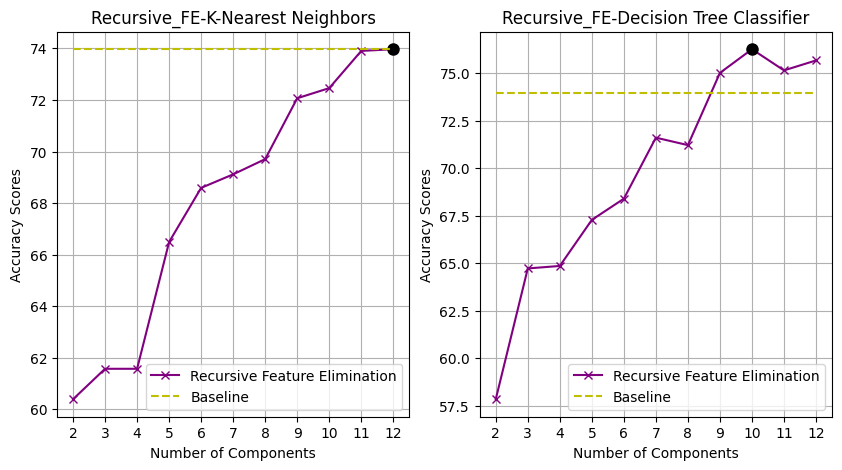

In [ ]:
Baseline_knn_Scores,Baseline_DT_Scores=Baseline (x_train,x_test,range(2,13))
knn_RFE_Accuracy_Scores,DT_RFE_Accuracy_Scores= Recursive_DR(x_train, y_train, x_test, y_test)
RFE_knn_N, RFE_knn_value, RFE_DT_N ,RFE_DT_value= draw_plots(knn_RFE_Accuracy_Scores,DT_RFE_Accuracy_Scores,Baseline_knn_Scores,Baseline_DT_Scores,'Recursive_FE-K-Nearest Neighbors','Recursive_FE-Decision Tree Classifier',range(2,13),'Recursive Feature Elimination')

## c) TSNE on Best Componets

In [ ]:
def drawConfusionMatrix(X_train, y_train, X_test, y_test, FSM, model,model_name):
  fs = FSM
  fs.fit(X_train, y_train)
  X_train_new = fs.transform(X_train)
  X_test_new = fs.transform(X_test)
  model.fit(X_train_new, y_train)
  y_test_pred = model.predict(X_test_new)
  y_train_pred = model.predict(X_train_new)

  # Confusion Matrix for Training and Testing
  cm_train = confusion_matrix(y_train, y_train_pred)
  cm_test = confusion_matrix(y_test, y_test_pred)

  # Visualize the confusion matrices using Seaborn
  fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

  sns.heatmap(cm_train, annot=True, cmap='Pastel2', ax=axs[0], fmt='g')
  axs[0].set_title(f"{model_name} Training Confusion Matrix")
  axs[0].set_xlabel('Predicted Labels')
  axs[0].set_ylabel('Actual Labels')

  sns.heatmap(cm_test, annot=True, cmap='Pastel1', ax=axs[1], fmt='g')
  axs[1].set_title(f"{model_name} Testing Confusion Matrix")
  axs[1].set_xlabel('Predicted Labels')
  axs[1].set_ylabel('Actual Labels')

  plt.tight_layout()
  plt.show()
  print("------------------------------------------------------------------------------------------------------")

In [ ]:
def drawConfusionMatrix_Wrapper(X_train, y_train, X_test, y_test,model_name, modelN):

  if modelN=='Knn':
    #KNN
    # Sequential Feature Selector
    knn_estimator = KNeighborsClassifier()
    knn_sfs = SequentialFeatureSelector(knn_estimator, n_features_to_select='auto', direction= d, scoring='accuracy')
    knn_X_selected = knn_sfs.fit_transform(x_train, y_train)

    # Train a model using the selected features
    knn_estimator.fit(knn_X_selected, y_train)

    knn_X_test_selected = knn_sfs.transform(x_test)
    y_test_predictions = knn_estimator.predict(knn_X_test_selected)


    knn_X_train_selected = knn_sfs.transform(x_train)
    y_train_predictions = knn_estimator.predict(knn_X_train_selected)

  elif modelN=='DT':
    #DecisionTree
    # Sequential Feature Selector
    DT_estimator = DecisionTreeClassifier(DecisionTreeClassifier(random_state=42))
    DT_sfs = SequentialFeatureSelector(DT_estimator, n_features_to_select='auto', direction= d, scoring='accuracy')
    DT_X_selected = DT_sfs.fit_transform(x_train, y_train)

    # Train a model using the selected features
    DT_estimator.fit(DT_X_selected, x_train)

    DT_X_test_selected = DT_sfs.transform(x_test)
    y_test_predictions = DT_estimator.predict(DT_X_test_selected)

    DT_X_train_selected = DT_sfs.transform(x_test)
    y_train_predictions = DT_estimator.predict(DT_X_train_selected)


  # Confusion Matrix for Training and Testing
  cm_train = confusion_matrix(y_train, y_train_predictions)
  cm_test = confusion_matrix(y_test, y_test_predictions)

  # Visualize the confusion matrices using Seaborn
  fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

  sns.heatmap(cm_train, annot=True, cmap='Pastel2', ax=axs[0], fmt='g')
  axs[0].set_title(f"{model_name} Training Confusion Matrix")
  axs[0].set_xlabel('Predicted Labels')
  axs[0].set_ylabel('Actual Labels')

  sns.heatmap(cm_test, annot=True, cmap='Pastel1', ax=axs[1], fmt='g')
  axs[1].set_title(f"{model_name} Testing Confusion Matrix")
  axs[1].set_xlabel('Predicted Labels')
  axs[1].set_ylabel('Actual Labels')

  plt.tight_layout()
  plt.show()
  print("------------------------------------------------------------------------------------------------------")


Best Dimensionality Reduction method in Filter Methods




In [ ]:
# Determine the maximum value and its corresponding information
F_max_value = max(IG_knn_value, IG_DT_value, VT_knn_value, VT_DT_value, CS_knn_value, CS_DT_value, FS_knn_value, FS_DT_value)

# Check which variable has the maximum value
if F_max_value == IG_knn_value:
    F_max_N = IG_knn_N
    F_max_name = 'Information Gain_knn'
elif F_max_value == IG_DT_value:
    F_max_N = IG_DT_N
    F_max_name = 'Information Gain_DT'
elif F_max_value == VT_knn_value:
    F_max_N = VT_knn_N
    F_max_name = 'Variance Threshold_knn'
elif F_max_value == VT_DT_value:
    F_max_N = VT_DT_N
    F_max_name = 'Variance Threshold_DT'
elif F_max_value == CS_knn_value:
    F_max_N = CS_knn_N
    F_max_name = 'Chi-Square_knn'
elif F_max_value == CS_DT_value:
    F_max_N = CS_DT_N
    F_max_name = 'Chi-Square_DT'
elif F_max_value == FS_knn_value:
    F_max_N = FS_knn_N
    F_max_name = 'Feature Selection_knn'
elif F_max_value == FS_DT_value:
    F_max_N = FS_DT_N
    F_max_name = 'Feature Selection_DT'

# Check if the maximum value corresponds to knn or DT
if 'knn' in F_max_name:
    print(f"Best Method in K-Nearest Neighbor(KNN) is: {F_max_name}")
else:
    print(f"Best Method in Decision Tree Classifier is {F_max_name}")

# Print the maximum value and corresponding information
print("Maximum value:", F_max_value)
print("Corresponding N:",F_max_N)
print("Corresponding Name:", F_max_name)


Best Method in Decision Tree Classifier is Information Gain_DT
Maximum value: 76.65573770491804
Corresponding N: 8
Corresponding Name: Information Gain_DT


**Best**  Dimensionality Reduction method in Wrapper Methods

In [ ]:
# Determine the maximum value and its corresponding information
W_max_value = max(FW_knn_value,FW_DT_value,BW_knn_value,BW_DT_value,RFE_knn_value,RFE_DT_value)

# Check which variable has the maximum value
if W_max_value == FW_knn_value:
    W_max_N = FW_knn_N
    W_max_name = 'Forward Feature Elimination _knn'
elif W_max_value == FW_DT_value:
    W_max_N = FW_DT_N
    W_max_name = 'Forward Feature Elimination_DT'
elif W_max_value == BW_knn_value:
    W_max_N = BW_knn_N
    W_max_name = 'Backward Feature Elimination_knn'
elif W_max_value == BW_DT_value:
    W_max_N = BW_DT_N
    W_max_name = 'Backward Feature Elimination_DT'
elif W_max_value == RFE_knn_value:
    W_max_N = RFE_knn_N
    W_max_name = 'Recursive Feature Elimination_knn'
elif W_max_value == RFE_DT_value:
    W_max_N = RFE_DT_N
    W_max_name = 'Recursive Feature Elimination_DT'

# Check if the maximum value corresponds to knn or DT
if 'knn' in W_max_name:
    print(f"Best Method in K-Nearest Neighbor(KNN) is {W_max_name}")
else:
    print(f"Best Method in Decision Tree Classifier  is {W_max_name}")

# Print the maximum value and corresponding information
print("Maximum value:", W_max_value)
print("Corresponding N:", W_max_N)
print("Corresponding Name:", W_max_name)


Best Method in Decision Tree Classifier  is Recursive Feature Elimination_DT
Maximum value: 76.26229508196721
Corresponding N: 10
Corresponding Name: Recursive Feature Elimination_DT


In [ ]:
# Determine the maximum value and its corresponding information
max_value = max(F_max_value, W_max_value)

# Check which variable has the maximum value
if max_value == F_max_value:
    max_N = F_max_N
    max_name = F_max_name
else:
    max_N = W_max_N
    max_name = W_max_name

# Check if the maximum value corresponds to BNB or Knn
if 'knn' in max_name:
    print(f"Best Method in K-Nearest Neighbor(KNN)s is {max_name}")
else:
    print(f"Best Method in Decision Tree Classifier  is {max_name}")

# Print the maximum value and corresponding information
print("Maximum value:", max_value)
print("Corresponding N:", max_N)
print("Corresponding Name:", max_name)


Best Method in Decision Tree Classifier  is Information Gain_DT
Maximum value: 76.65573770491804
Corresponding N: 8
Corresponding Name: Information Gain_DT


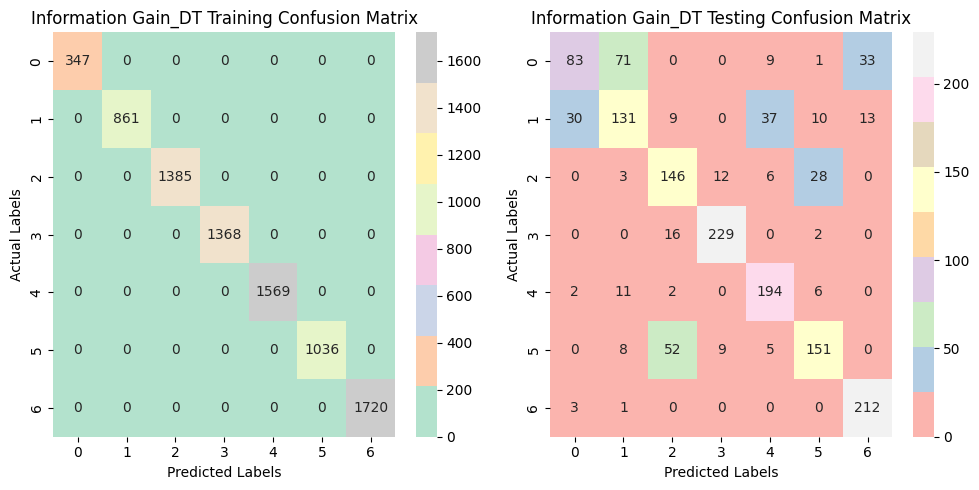

------------------------------------------------------------------------------------------------------


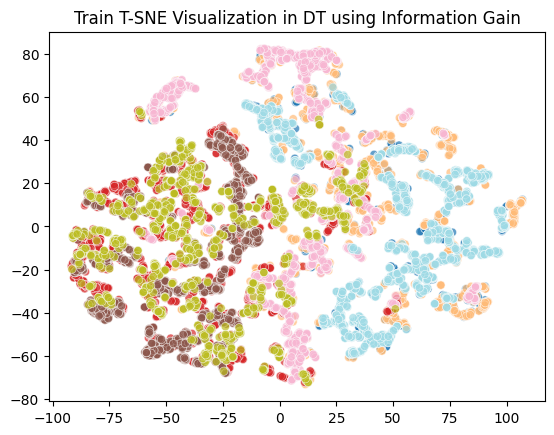

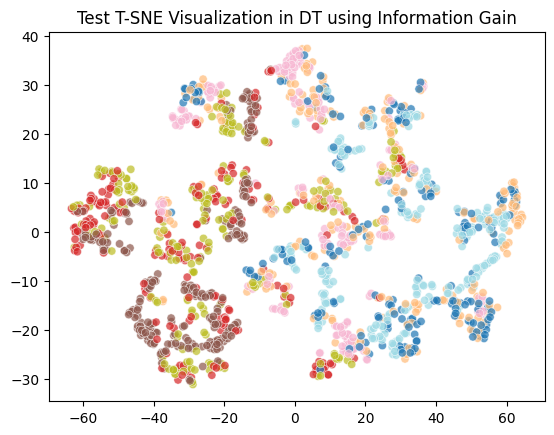

In [ ]:
if  max_name == 'Information Gain_knn':
      fs = SelectKBest(mutual_info_classif, k=max_N)
      fs.fit(x_train, y_train)
      X_train_new = fs.transform(x_train)
      X_test_new = fs.transform(x_test)
      drawConfusionMatrix(x_train, y_train, x_test, y_test, fs,KNeighborsClassifier(),max_name)
      tsne (X_train_new ,y_train,f'Train T-SNE Visualization in knn using Information Gain')
      tsne (X_test_new ,y_test,f'Test T-SNE Visualization in knn using Information Gain')


elif max_name == 'Information Gain_DT':
      fs = SelectKBest(mutual_info_classif, k=max_N)
      fs.fit(x_train, y_train)
      X_train_new = fs.transform(x_train)
      X_test_new = fs.transform(x_test)
      drawConfusionMatrix(x_train, y_train, x_test, y_test, fs,DecisionTreeClassifier(random_state=42),max_name)
      tsne (X_train_new ,y_train,f'Train T-SNE Visualization in DT using Information Gain')
      tsne (X_test_new ,y_test,f'Test T-SNE Visualization in DT using Information Gain')


elif max_name == 'Variance Threshold_knn':
    fs = VarianceThreshold(threshold=max_N)
    fs.fit(x_train, y_train)
    X_train_new = fs.transform(x_train)
    X_test_new = fs.transform(x_test)
    drawConfusionMatrix(x_train, y_train, x_test, y_test, fs,KNeighborsClassifier(),max_name)
    tsne (X_train_new ,y_train,f'Train T-SNE Visualization in knn using Variance Threshold')
    tsne (X_test_new ,y_test,f'Test T-SNE Visualization in knn using Variance Threshold')


elif max_name == 'Variance Threshold_DT':
    fs = VarianceThreshold(threshold=max_N)
    fs.fit(x_train, y_train)
    X_train_new = fs.transform(x_train)
    X_test_new = fs.transform(x_test)
    drawConfusionMatrix(x_train, y_train, x_test, y_test, fs,DecisionTreeClassifier(random_state=42),max_name)
    tsne (X_train_new ,y_train,f'Train T-SNE Visualization in DT using Variance Threshold')
    tsne (X_test_new ,y_test,f'Test T-SNE Visualization in DT using Variance Threshold')


elif max_name == 'Chi-Square_knn':
    fs = SelectKBest(mutual_info_classif, k=max_N)
    fs.fit(x_train, y_train)
    X_train_new = fs.transform(x_train)
    X_test_new = fs.transform(x_test)
    drawConfusionMatrix(x_train, y_train, x_test, y_test, fs,KNeighborsClassifier(),max_name)
    tsne(X_train_new, y_train, f'Train T-SNE Visualization in knn using Mutual Information')
    tsne(X_test_new, y_test, f'Test T-SNE Visualization in knn using Mutual Information')

elif max_name == 'Chi-Square _DT':
    fs = SelectKBest (chi2, k=max_N)
    fs.fit(x_train, y_train)
    X_train_new = fs.transform(x_train)
    X_test_new = fs.transform(x_test)
    drawConfusionMatrix(x_train, y_train, x_test, y_test, fs,DecisionTreeClassifier(random_state=42),max_name)
    tsne (X_train_new ,y_train,f'Train T-SNE Visualization in DT using Chi-Square')
    tsne (X_test_new ,y_test,f'Test T-SNE Visualization in DT using Chi-Square')


elif max_name == 'Feature Selection_knn':
    fs = SelectKBest (f_classif, k=max_N)
    fs.fit(x_train, y_train)
    X_train_new = fs.transform(x_train)
    X_test_new = fs.transform(x_test)
    drawConfusionMatrix(x_train, y_train, x_test, y_test, fs,KNeighborsClassifier(),max_name)
    tsne (X_train_new ,y_train,f'Train T-SNE Visualization in knn using Feature Selection')
    tsne (X_test_new ,y_test,f'Test T-SNE Visualization in knn using Feature Selection')


elif max_name == 'Feature Selection_DT':
    fs = SelectKBest (f_classif, k=max_N)
    fs.fit(x_train, y_train)
    X_train_new = fs.transform(x_train)
    X_test_new = fs.transform(x_test)
    drawConfusionMatrix(x_train, y_train, x_test, y_test, fs,DecisionTreeClassifier(random_state=42),max_name)
    tsne (X_train_new ,y_train,f'Train T-SNE Visualization in DT using Feature Selection')
    tsne (X_test_new ,y_test,f'Test T-SNE Visualization in DT using Feature Selection')



elif max_name == 'Forward Feature Elimination _knn':
    knn_estimator = KNeighborsClassifier()
    knn_sfs = SequentialFeatureSelector(knn_estimator, n_features_to_select=max_name, direction= 'forward', scoring='accuracy')
    knn_X_selected = knn_sfs.fit_transform(x_train, y_train)

    # Train a model using the selected features
    knn_estimator.fit(knn_X_selected, y_train)
    knn_X_test_selected = knn_sfs.transform(x_test)
    drawConfusionMatrix_Wrapper(x_train, y_train, x_test, y_test,max_name, 'Knn')
    tsne (knn_X_selected ,y_train,f'Train T-SNE Visualization in knn using Forward Feature Elimination')
    tsne (knn_X_test_selected ,y_test,f'Test T-SNE Visualization in knn using Forward Feature Elimination')

elif max_name == 'Forward Feature Elimination_DT':
    DT_estimator = DecisionTreeClassifier(random_state=42)
    DT_sfs = SequentialFeatureSelector(DT_estimator, n_features_to_select=max_N, direction= 'forward', scoring='accuracy')
    DT_X_selected = DT_sfs.fit_transform(x_train, y_train)
    DT_estimator.fit(DT_X_selected, y_train)
    DT_X_test_selected = DT_sfs.transform(x_test)
    drawConfusionMatrix_Wrapper(x_train, y_train, x_test, y_test,max_name, 'DT')
    tsne (DT_X_selected ,y_train,f'Train T-SNE Visualization in DT using Forward Feature Elimination')
    tsne (DT_X_test_selected ,y_test,f'Test T-SNE Visualization in DT using Forward Feature Elimination')

elif max_name == 'Backward Feature Elimination_knn':
    knn_estimator = KNeighborsClassifier()
    knn_sfs = SequentialFeatureSelector(knn_estimator, n_features_to_select=max_name, direction= 'backward', scoring='accuracy')
    knn_X_selected = knn_sfs.fit_transform(x_train, y_train)

    # Train a model using the selected features
    knn_estimator.fit(knn_X_selected, y_train)
    knn_X_test_selected = knn_sfs.transform(x_test)
    drawConfusionMatrix_Wrapper(x_train, y_train, x_test, y_test,max_name, 'Knn')
    tsne (knn_X_selected ,y_train,f'Train T-SNE Visualization in knn using Backard Feature Elimination')
    tsne (knn_X_test_selected ,y_test,f'Test T-SNE Visualization in knn using Backward Feature Elimination')

elif max_name == 'Backward Feature Elimination_DT':
    DT_estimator = DecisionTreeClassifier(random_state=42)
    DT_sfs = SequentialFeatureSelector(DT_estimator, n_features_to_select=max_N, direction= 'backward', scoring='accuracy')
    DT_X_selected = DT_sfs.fit_transform(x_train, y_train)
    DT_estimator.fit(DT_X_selected, y_train)
    DT_X_test_selected = DT_sfs.transform(x_test)
    drawConfusionMatrix_Wrapper(x_train, y_train, x_test, y_test,max_name, 'DT')
    tsne (DT_X_selected ,y_train,f'Train T-SNE Visualization in DT using Backward Feature Elimination')
    tsne (DT_X_test_selected ,y_test,f'Test T-SNE Visualization in DT using Backward Feature Elimination')


elif max_name == 'Recursive Feature Elimination_knn':
    knn_clf_rfe = KNeighborsClassifier()
    knn_clf_rfe.fit(x_train.iloc[:, :max_N], y_train)
    knn_permutation_importances =compute_permutation_importances(knn_clf_rfe, x_test.iloc[:, :max_N], y_test)

    # Apply Recursive Feature Elimination (RFE) with NB classifier and permutation importances
    rfe_nb = RFE(estimator=knn_clf_rfe, n_features_to_select=max_N, importance_getter=lambda _: knn_permutation_importances)
    X_train_rfe = rfe_nb.fit_transform(x_train, y_train)
    X_test_rfe = rfe_nb.transform(x_test)
    drawConfusionMatrix_Wrapper(x_train, y_train, x_test, y_test,max_name, 'Knn')
    tsne (X_train_rfe ,y_train,f'Train T-SNE Visualization in knn using Recursive Feature Elimination')
    tsne (X_test_rfe,y_test,f'Test T-SNE Visualization in knn using Recursive Feature Elimination')


elif max_name ==  'Recursive Feature Elimination_DT':
    DT_clf_rfe = DecisionTreeClassifier(random_state=42)
    DT_clf_rfe.fit(x_train.iloc[:, :max_N], y_train)
    DT_permutation_importances = compute_permutation_importances(DT_clf_rfe, x_test.iloc[:, :max_N], y_test)

    # Apply Recursive Feature Elimination (RFE) with NB classifier and permutation importances
    rfe_DT = RFE(estimator=DT_clf_rfe, n_features_to_select=max_N, importance_getter=lambda _: knn_permutation_importances)
    X_train_rfe = rfe_DT.fit_transform(x_train, y_train)
    X_test_rfe = rfe_DT.transform(x_test)
    drawConfusionMatrix_Wrapper(x_train, y_train, x_test, y_test,max_name, 'DT')
    tsne (X_train_rfe ,y_train,f'Train T-SNE Visualization in DT using Recursive Feature Elimination')
    tsne (X_test_rfe ,y_test,f'Test T-SNE Visualization in DT using Recursive Feature Elimination')


## Apply OverSimpling and Under Sampling

In [ ]:
def plot_tsne(X, y, clf, ax, title=None):
    # Convert X and y to NumPy arrays if they are DataFrames or Series
    X = X.values if isinstance(X, pd.DataFrame) else X
    y = y.values if isinstance(y, pd.Series) else y

    # Apply t-SNE to reduce the dimensionality to 2D
    tsne = TSNE(n_components=2, random_state=0)
    X_tsne = tsne.fit_transform(X)

    # Map class labels to different colors for plotting
    unique_classes = np.unique(y)
    n_classes = len(unique_classes)
    colors = plt.cm.tab10(np.linspace(0, 1, n_classes))

    for i, class_label in enumerate(unique_classes):
        class_mask = (y == class_label)
        ax.scatter(X_tsne[class_mask, 0], X_tsne[class_mask, 1], alpha=0.8, c=colors[i], edgecolor="k", label=f"Class {class_label}")

    ax.set_xticks(())
    ax.set_yticks(())

    if title is not None:
        ax.set_title(title)
    if n_classes > 1:
        ax.legend(loc="upper right")

In [ ]:
def plot_resampling_tsne(X, y, sampler, ax, title=None):
    X_res, y_res = sampler.fit_resample(X, y)

    # Apply t-SNE to reduce the dimensionality to 2D
    tsne = TSNE(n_components=2, random_state=0)
    X_res_tsne = tsne.fit_transform(X_res)

    # Map class labels to different colors for plotting
    unique_classes = np.unique(y_res)
    n_classes = len(unique_classes)
    colors = plt.cm.tab10(np.linspace(0, 1, n_classes))

    for i, class_label in enumerate(unique_classes):
        class_mask = (y_res == class_label)
        ax.scatter(X_res_tsne[class_mask, 0], X_res_tsne[class_mask, 1], alpha=0.8, c=colors[i], edgecolor="k", label=f"Class {class_label}")

    if title is None:
        title = f"Resampling with {sampler.__class__.__name__} + t-SNE"
    ax.set_title(title)
    sns.despine(ax=ax, offset=10)

    if n_classes > 1:
        ax.legend(loc="upper right")


              precision    recall  f1-score   support

           1       0.55      0.57      0.56       197
           2       0.59      0.38      0.46       230
           3       0.61      0.58      0.60       195
           4       0.80      0.93      0.86       247
           5       0.73      0.87      0.80       215
           6       0.69      0.63      0.66       225
           7       0.81      0.89      0.85       216

    accuracy                           0.70      1525
   macro avg       0.68      0.69      0.68      1525
weighted avg       0.69      0.70      0.69      1525

              precision    recall  f1-score   support

           1       0.68      0.22      0.33       197
           2       0.61      0.49      0.54       230
           3       0.74      0.75      0.75       195
           4       0.86      0.98      0.91       247
           5       0.68      0.98      0.80       215
           6       0.79      0.71      0.75       225
           7       0.74 

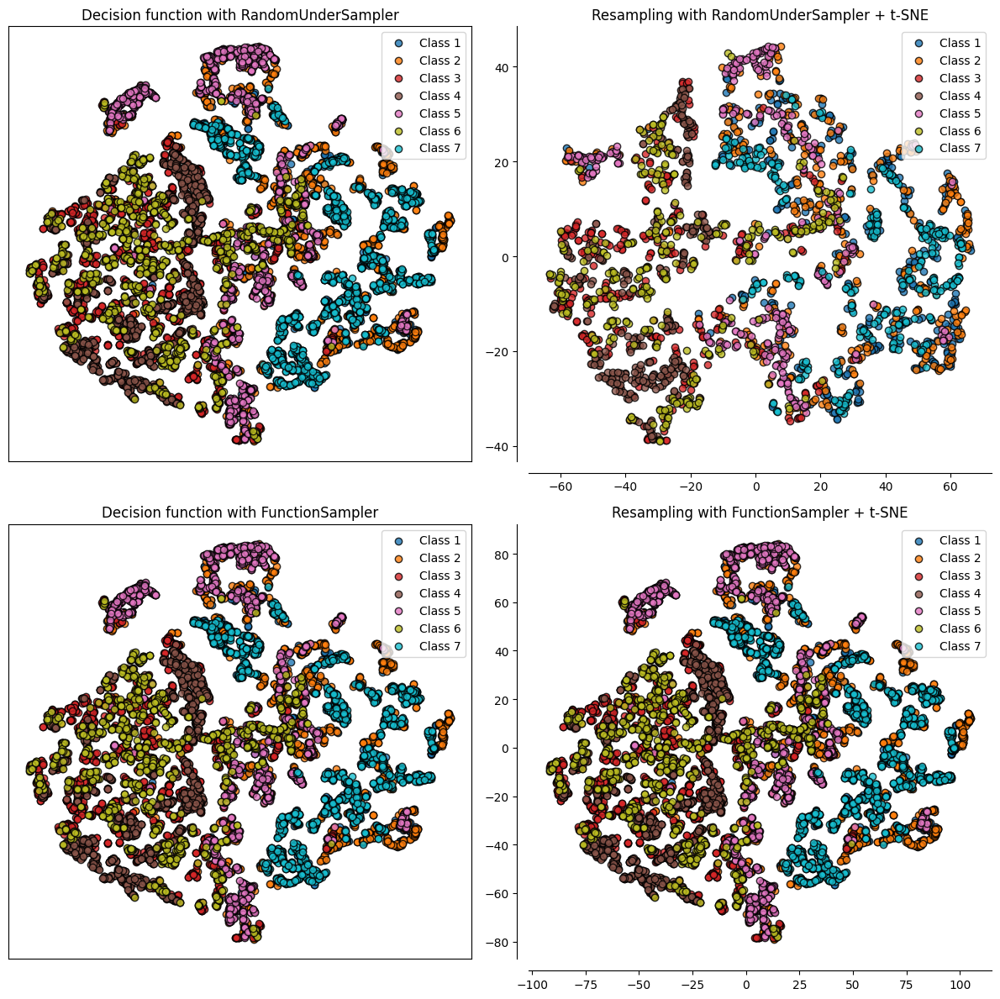

In [ ]:
clf = KNeighborsClassifier()

samplers = {
    FunctionSampler(),  # identity resampler
    RandomUnderSampler(random_state=0),
}

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
for ax, sampler in zip(axs, samplers):
  model = make_pipeline(sampler, clf).fit(x_train, y_train)
  plot_tsne(
      x_train, y_train, model, ax[0], title=f"Decision function with {sampler.__class__.__name__}"
  )
  plot_resampling_tsne(x_train, y_train, sampler, ax[1])
  y_pred = model.predict(x_test)
  report = classification_report(y_test, y_pred)
  print(report)
  fig.tight_layout()

              precision    recall  f1-score   support

           1       0.68      0.22      0.33       197
           2       0.61      0.49      0.54       230
           3       0.74      0.75      0.75       195
           4       0.86      0.98      0.91       247
           5       0.68      0.98      0.80       215
           6       0.79      0.71      0.75       225
           7       0.74      1.00      0.85       216

    accuracy                           0.74      1525
   macro avg       0.73      0.73      0.71      1525
weighted avg       0.73      0.74      0.71      1525

              precision    recall  f1-score   support

           1       0.66      0.49      0.57       197
           2       0.63      0.51      0.57       230
           3       0.80      0.73      0.76       195
           4       0.87      0.97      0.92       247
           5       0.74      0.95      0.83       215
           6       0.79      0.77      0.78       225
           7       0.83 

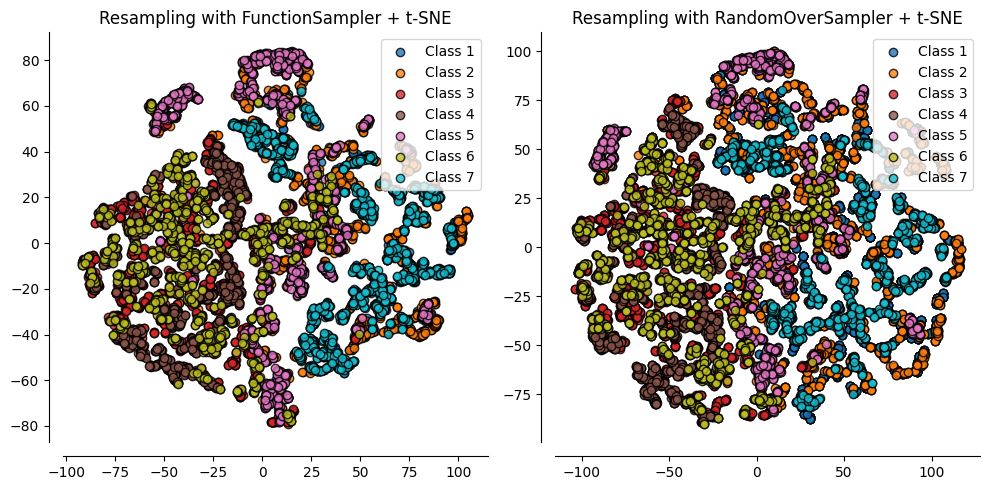

In [ ]:
samplers = {
    FunctionSampler(),  # identity resampler
    RandomOverSampler(random_state=0),
}

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
for i, sampler in enumerate(samplers):
    ax = axs[i]  # Access the individual axes using the index i
    model = make_pipeline(sampler, clf).fit(x_train, y_train)
    plot_resampling_tsne(x_train, y_train, sampler, ax)
    y_pred = model.predict(x_test)
    report = classification_report(y_test, y_pred)
    print(report)

fig.tight_layout()


              precision    recall  f1-score   support

           1       0.68      0.22      0.33       197
           2       0.61      0.49      0.54       230
           3       0.74      0.75      0.75       195
           4       0.86      0.98      0.91       247
           5       0.68      0.98      0.80       215
           6       0.79      0.71      0.75       225
           7       0.74      1.00      0.85       216

    accuracy                           0.74      1525
   macro avg       0.73      0.73      0.71      1525
weighted avg       0.73      0.74      0.71      1525

              precision    recall  f1-score   support

           1       0.66      0.52      0.59       197
           2       0.67      0.50      0.57       230
           3       0.79      0.70      0.74       195
           4       0.86      0.97      0.91       247
           5       0.77      0.95      0.85       215
           6       0.77      0.79      0.78       225
           7       0.84 

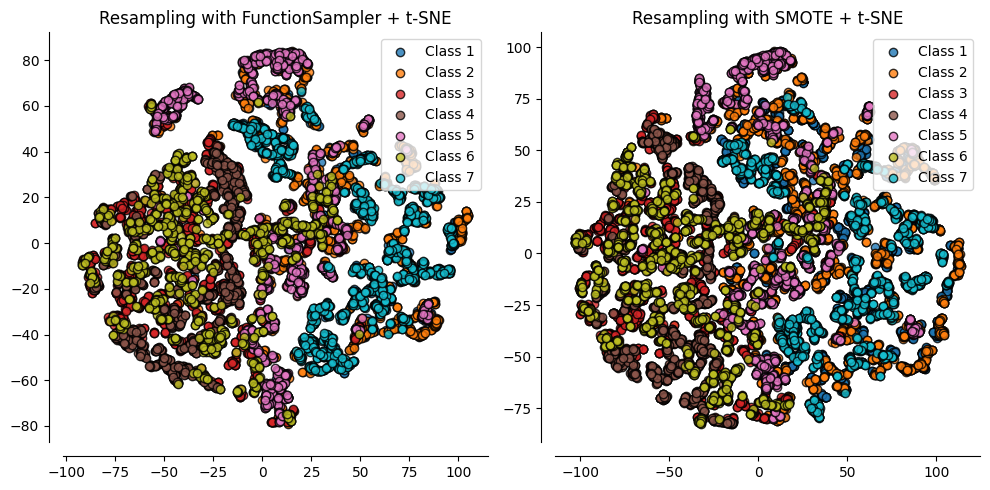

In [ ]:
samplers = {
    FunctionSampler(),  # identity resampler
    SMOTE(random_state=0),
}

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
for ax, sampler in zip(axs, samplers):
    model = make_pipeline(sampler, clf).fit(x_train, y_train)
    plot_resampling_tsne(x_train, y_train, sampler, ax)  # Directly pass the 'ax' here
    y_pred = model.predict(x_test)
    report = classification_report(y_test, y_pred)
    print(report)

fig.tight_layout()


# Q3) Apply Random Forest and 2 ensembles techniques



In [ ]:
def plotEstimator_tsne(trX, trY, teX, teY, estimator, title=''):
    trX = trX.values if isinstance(trX, pd.DataFrame) else trX
    teX = teX.values if isinstance(teX, pd.DataFrame) else teX
    trY = trY.values if isinstance(trY, pd.Series) else trY
    teY = teY.values if isinstance(teY, pd.Series) else teY

    # Fit t-SNE on the training data
    tsne = TSNE(n_components=2, random_state=0)
    trX_tsne = tsne.fit_transform(trX)

    # Use a colormap suitable for multiple classes
    cm_bright = ListedColormap(['#FF0000', '#0000FF', '#00FF00', '#FF00FF', '#FFFF00', '#00FFFF', '#800080'])

    # Plot the t-SNE embeddings with different colors for each class
    plt.scatter(trX_tsne[:, 0], trX_tsne[:, 1], c=trY, cmap=cm_bright, edgecolors='k', alpha=0.6)
    plt.title(title)
    plt.show()

In [ ]:
EnsemblesMethod = {'Bagging': set() ,'Boosting': set() ,'RandomForest': set() }

Index: 1 Accuracy: 0.7383606557377049
Index: 2 Accuracy: 0.7390163934426229
Index: 3 Accuracy: 0.778360655737705
Index: 4 Accuracy: 0.7652459016393443
Index: 5 Accuracy: 0.7816393442622951
Index: 6 Accuracy: 0.7934426229508197
Index: 7 Accuracy: 0.7993442622950819
Index: 8 Accuracy: 0.8059016393442623
Index: 9 Accuracy: 0.8032786885245902
Index: 10 Accuracy: 0.801967213114754
Index: 11 Accuracy: 0.8032786885245902
Index: 12 Accuracy: 0.8091803278688524
Index: 13 Accuracy: 0.8052459016393443
Index: 14 Accuracy: 0.8059016393442623
Index: 15 Accuracy: 0.8085245901639344
Index: 16 Accuracy: 0.8045901639344263
Index: 17 Accuracy: 0.8078688524590164
Index: 18 Accuracy: 0.8045901639344263
Index: 19 Accuracy: 0.8131147540983606


Max: 0.8131147540983606 Index: 19


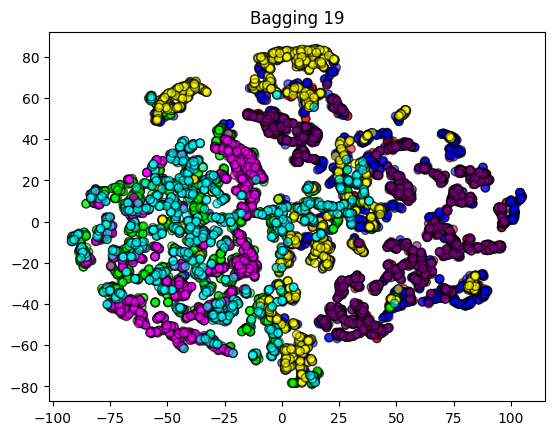

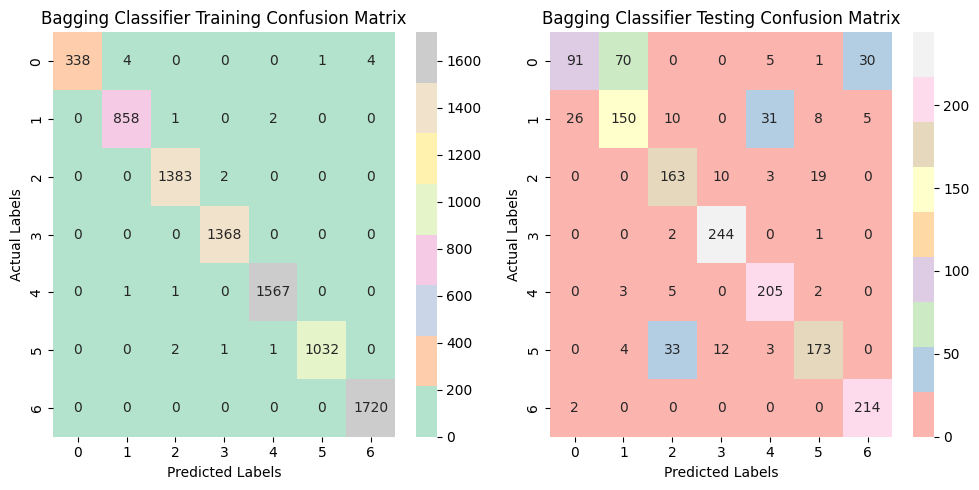

In [ ]:
#Bagging Method
max=0
index=0
for nEst in range(1, 20):
  estimator = BaggingClassifier(n_estimators=nEst, random_state=2022)
  estimator.fit(x_train, y_train)
  y_pred = estimator.predict(x_test)
  accuracy = accuracy_score(y_test, y_pred)
  print("Index:", nEst, "Accuracy:", accuracy)
  if accuracy>max:
    max=accuracy
    index=nEst

print('\n')
print("Max:", max, "Index:", index)
EnsemblesMethod['Bagging'].add((index, max))

estimator = BaggingClassifier(n_estimators=index, random_state=2022)
estimator.fit(x_train, y_train)
y_train_pred = estimator.predict(x_train)
y_test_pred = estimator.predict(x_test)

plotEstimator_tsne(x_train, y_train, x_test, y_test, estimator, f'Bagging {nEst}')

#######################################################################
# Confusion Matrix for Training and Testing
cm_train = confusion_matrix(y_train, y_train_pred)
cm_test = confusion_matrix(y_test, y_test_pred)

# Visualize the confusion matrices using Seaborn
fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

sns.heatmap(cm_train, annot=True, cmap='Pastel2', ax=axs[0], fmt='g')
axs[0].set_title("Bagging Classifier Training Confusion Matrix")
axs[0].set_xlabel('Predicted Labels')
axs[0].set_ylabel('Actual Labels')

sns.heatmap(cm_test, annot=True, cmap='Pastel1', ax=axs[1], fmt='g')
axs[1].set_title("Bagging Classifier Testing Confusion Matrix")
axs[1].set_xlabel('Predicted Labels')
axs[1].set_ylabel('Actual Labels')

plt.tight_layout()
plt.show()

Index: 1 Accuracy: 0.5075409836065574
Index: 2 Accuracy: 0.5632786885245902
Index: 3 Accuracy: 0.5672131147540984
Index: 4 Accuracy: 0.6085245901639345
Index: 5 Accuracy: 0.6157377049180328
Index: 6 Accuracy: 0.6288524590163934
Index: 7 Accuracy: 0.6347540983606558
Index: 8 Accuracy: 0.639344262295082
Index: 9 Accuracy: 0.6386885245901639
Index: 10 Accuracy: 0.6498360655737705
Index: 11 Accuracy: 0.6531147540983606
Index: 12 Accuracy: 0.6577049180327869
Index: 13 Accuracy: 0.6642622950819672
Index: 14 Accuracy: 0.6747540983606557
Index: 15 Accuracy: 0.6819672131147541
Index: 16 Accuracy: 0.6839344262295082
Index: 17 Accuracy: 0.6859016393442623
Index: 18 Accuracy: 0.6904918032786885
Index: 19 Accuracy: 0.6977049180327869


Max: 0.6977049180327869 Index: 19


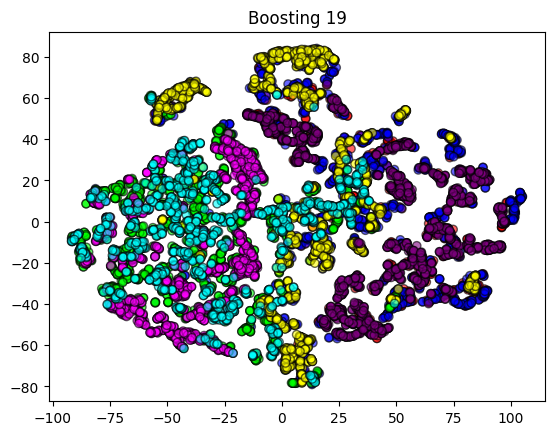

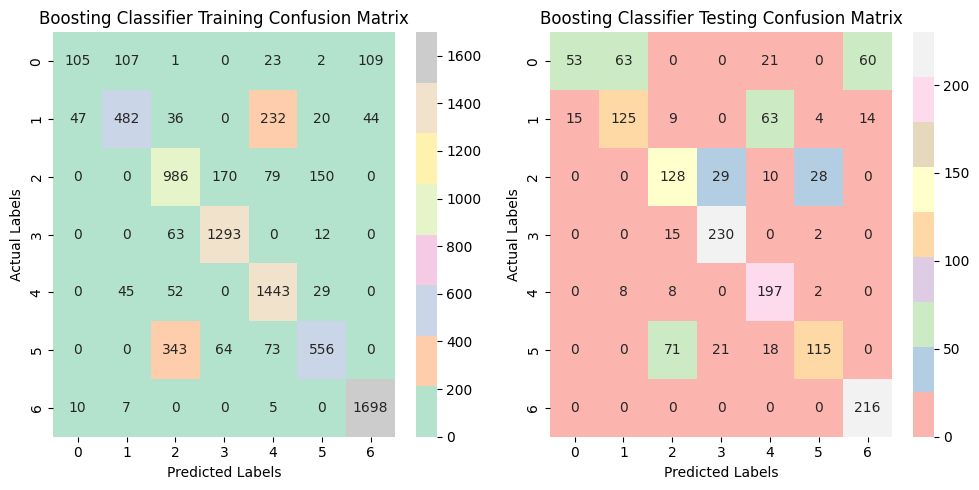

In [ ]:
#Boosting
max=0
index=0
for  nEst in range(1, 20):
  estimator = GradientBoostingClassifier(n_estimators=nEst, random_state=2022)
  estimator.fit(x_train, y_train)
  y_pred = estimator.predict(x_test)
  accuracy = accuracy_score(y_test, y_pred)
  print("Index:", nEst, "Accuracy:", accuracy)
  if accuracy>max:
    max=accuracy
    index=nEst

print('\n')
print("Max:", max, "Index:", index)
EnsemblesMethod['Boosting'].add((index, max))

estimator = GradientBoostingClassifier(n_estimators=index, random_state=2022)
estimator.fit(x_train, y_train)
y_train_pred = estimator.predict(x_train)
y_test_pred = estimator.predict(x_test)

plotEstimator_tsne(x_train, y_train, x_test, y_test, estimator, f'Boosting {nEst}')

#######################################################################
# Confusion Matrix for Training and Testing
cm_train = confusion_matrix(y_train, y_train_pred)
cm_test = confusion_matrix(y_test, y_test_pred)

# Visualize the confusion matrices using Seaborn
fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

sns.heatmap(cm_train, annot=True, cmap='Pastel2', ax=axs[0], fmt='g')
axs[0].set_title("Boosting Classifier Training Confusion Matrix")
axs[0].set_xlabel('Predicted Labels')
axs[0].set_ylabel('Actual Labels')

sns.heatmap(cm_test, annot=True, cmap='Pastel1', ax=axs[1], fmt='g')
axs[1].set_title("Boosting Classifier Testing Confusion Matrix")
axs[1].set_xlabel('Predicted Labels')
axs[1].set_ylabel('Actual Labels')

plt.tight_layout()
plt.show()

Accuracy : 0.6839344262295082


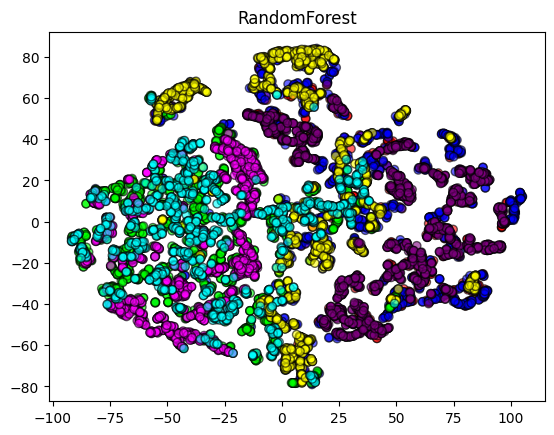

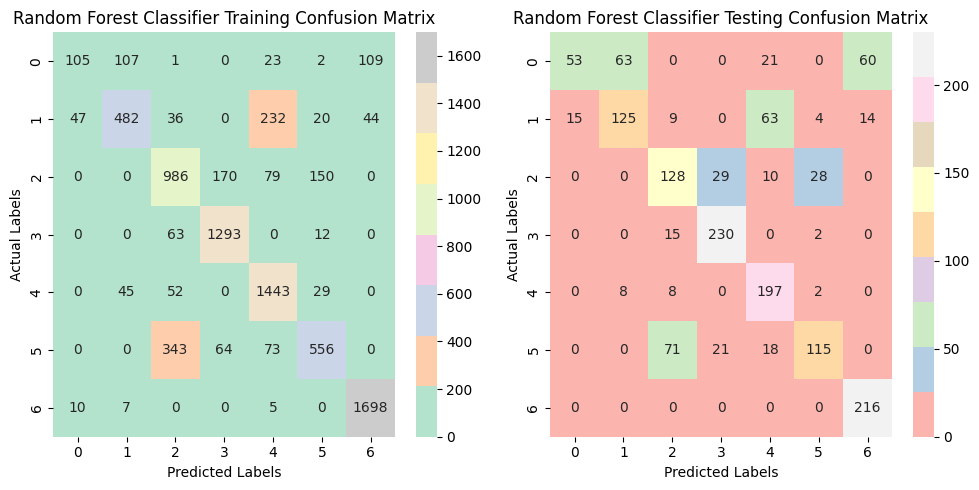

In [ ]:
desired_samples_per_class = {cls: 50 for cls in np.unique(y_train)}
# Initialize the RandomUnderSampler with the desired sampling_strategy
rus = RandomUnderSampler(sampling_strategy=desired_samples_per_class, random_state=0)

# Apply RandomUnderSampler to the training data
X_train, Y_train = rus.fit_resample(x_train, y_train)


# Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=2022)
rf_classifier.fit(X_train, Y_train)

# Predict on the test set
y_pred = rf_classifier.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy :", accuracy)
EnsemblesMethod['RandomForest'].add((0, accuracy))

plotEstimator_tsne(x_train, y_train, x_test, y_test, rf_classifier, 'RandomForest')

#######################################################################
# Confusion Matrix for Training and Testing
cm_train = confusion_matrix(y_train, y_train_pred)
cm_test = confusion_matrix(y_test, y_test_pred)

# Visualize the confusion matrices using Seaborn
fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

sns.heatmap(cm_train, annot=True, cmap='Pastel2', ax=axs[0], fmt='g')
axs[0].set_title("Random Forest Classifier Training Confusion Matrix")
axs[0].set_xlabel('Predicted Labels')
axs[0].set_ylabel('Actual Labels')

sns.heatmap(cm_test, annot=True, cmap='Pastel1', ax=axs[1], fmt='g')
axs[1].set_title("Random Forest Classifier Testing Confusion Matrix")
axs[1].set_xlabel('Predicted Labels')
axs[1].set_ylabel('Actual Labels')

plt.tight_layout()
plt.show()


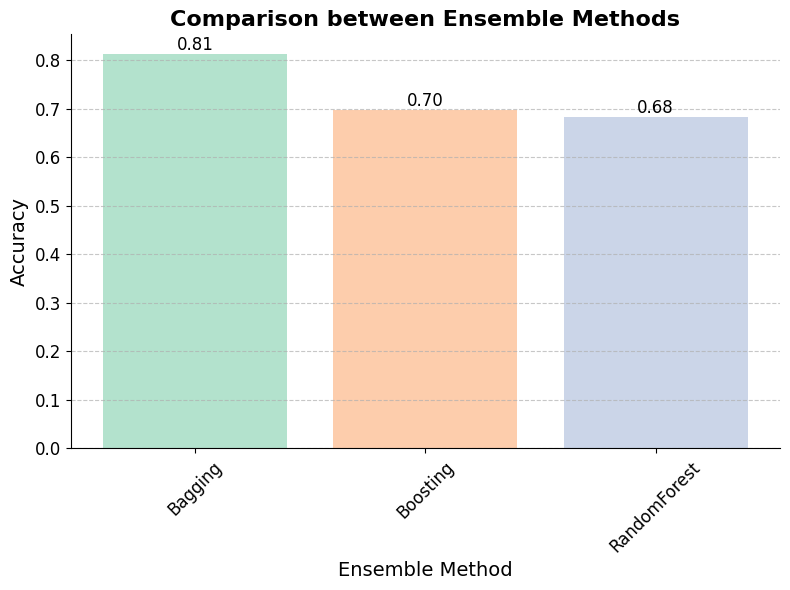

In [ ]:
# Extract the accuracy value for each ensemble method
accuracies = {key: scores.pop()[1] for key, scores in EnsemblesMethod.items()}

# Plot the bar chart
plt.figure(figsize=(8, 6))  # Adjust the figure size for better visualization
bars = plt.bar(accuracies.keys(), accuracies.values(), color=plt.cm.Pastel2.colors)

# Add data labels to the bars
for bar, value in zip(bars, accuracies.values()):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{value:.2f}', ha='center', va='bottom', fontsize=12)

# Customize plot aesthetics
plt.xlabel('Ensemble Method', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('Comparison between Ensemble Methods', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Remove top and right spines, and set gridlines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()  # Adjust the spacing to prevent clipping of labels
plt.show()

#Q4)Supervised & Unsupervised Combination via PKI

Q4
========================
APPLY BEST MODEL


sofm

In [ ]:
#x_train,y_train, x_test, y_test
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import accuracy_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

In [ ]:
def PKI_model(input_dim, num_neurons,layers):
    # Create the DNN model
    model = Sequential()

    # Add the first hidden layer with tanh activation
    model.add(Dense(num_neurons, activation='relu', input_dim=input_dim))

    # Add three more hidden layers with tanh activation
    for _ in range(layers-1):
        model.add(Dense(num_neurons, activation='relu'))

    # Add the output layer with appropriate activation for your specific problem (e.g., 'softmax' for multi-class classification)
    model.add(Dense(1, activation='tanh'))

    # Compile the model with Adam optimizer and the mean squared error loss function
    adam_optimizer = Adam(learning_rate=0.001)
    model.compile(optimizer=adam_optimizer, loss='mean_squared_error', metrics=['accuracy'])

    # Print a summary of the model architecture
    model.summary()

    return model






In [ ]:
def map_clusters_to_labels(cluster_predictions, true_labels):
    # Create a dictionary to store the cluster-wise samples
    cluster_samples = {cluster: [] for cluster in np.unique(cluster_predictions)}

    # Group samples based on their cluster predictions
    for i, cluster in enumerate(cluster_predictions):
        cluster_samples[cluster].append(true_labels[i])

    # Map each cluster to the most common label
    cluster_labels = {}
    for cluster, samples in cluster_samples.items():
        label_counts = Counter(samples)
        cluster_labels[cluster] = label_counts.most_common(1)[0][0]

    # Map the cluster predictions to labels
    predicted_labels = [cluster_labels[cluster] for cluster in cluster_predictions]

    return predicted_labels

In [ ]:
valid_set=validuation_DataSet


In [ ]:
x_valid = valid_set.drop(columns='Cover_Type')
y_valid=valid_set['Cover_Type']
x_valid.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area', 'Soil_Type'],
      dtype='object')

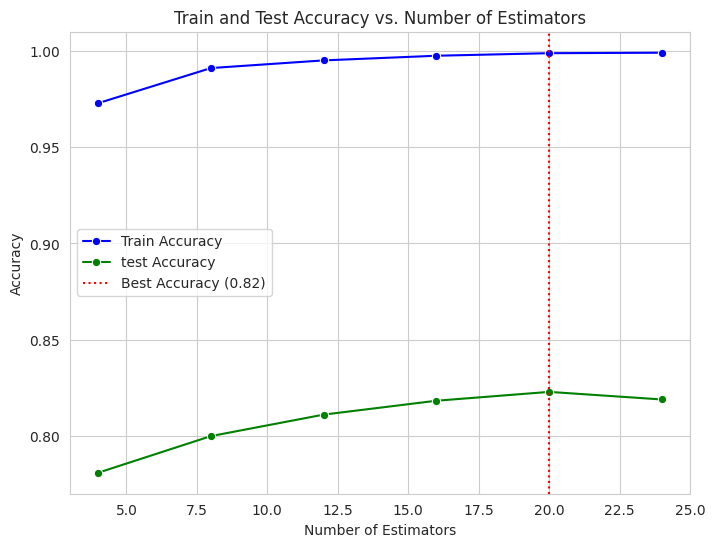

In [ ]:
n_estimators_range = [4, 8, 12, 16, 20, 24]  # Set the range of number of estimators
train_accuracies = []
test_accuracies = []

for n_estimators in n_estimators_range:
    # Create and fit the BaggingClassifier with the current number of estimators
    estimator = BaggingClassifier(n_estimators=n_estimators, random_state=123)
    estimator.fit(x_train, y_train)

    # Predict using the model
    train_y_pred = estimator.predict(x_train)
    test_y_pred = estimator.predict(x_test)

    # Calculate accuracies
    train_accuracy = accuracy_score(y_train, train_y_pred)
    test_accuracy = accuracy_score(y_test, test_y_pred)

    # Append the accuracies to the lists
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

# Find the best accuracy and its corresponding number of estimators
best_accuracy = max(test_accuracies)
best_n_estimators = n_estimators_range[np.argmax(test_accuracies)]

# Set Seaborn style (optional)
sns.set_style("whitegrid")

# Plotting the accuracies vs. the number of estimators using Seaborn
plt.figure(figsize=(8, 6))
sns.lineplot(x=n_estimators_range, y=train_accuracies, marker='o', color='b', label='Train Accuracy')
sns.lineplot(x=n_estimators_range, y=test_accuracies, marker='o', color='g', label='test Accuracy')
plt.axvline(x=best_n_estimators, color='r', linestyle='dotted', label=f'Best Accuracy ({best_accuracy:.2f})')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.title('Train and Test Accuracy vs. Number of Estimators')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
!pip install sklearn-som

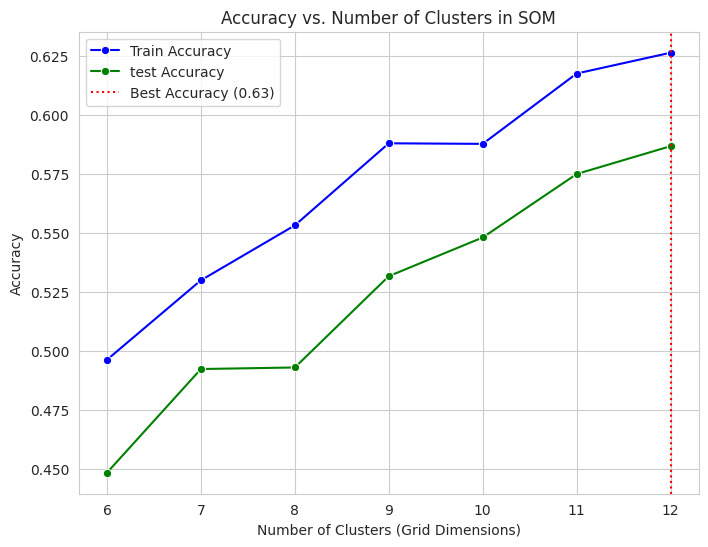

In [ ]:
#!pip install mlxtend
from sklearn_som.som import SOM
import numpy as np
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
# Assuming you have 'x_train' and 'y_train' as your input data and labels
# Convert the DataFrame to a NumPy array
x_train_np = x_train.to_numpy()
x_test_np=x_test.to_numpy()
# Define the number of clusters you want to try
#n_clusters = [8, 12, 16, 20, 32]
train_som_y_pred = []
test_som_y_pred = []
train_accuracies = []
test_accuracies = []
_,dim=x_train.shape
columns_rows=[6,7,8,9,10,11,12]
# Loop through each value of 'r' in the 'n_clusters' list
for r in columns_rows:
    np.random.seed(0)
    model = SOM(m=r, n=r, dim=dim)
    model.fit(x_train_np)
    train_predClusters = model.predict(x_train_np)
    test_predClusters = model.predict(x_test_np)
    # Map cluster predictions to labels
    train_predicted_labels = map_clusters_to_labels(train_predClusters, y_train)
    test_predicted_labels = map_clusters_to_labels(test_predClusters, y_test)
    train_som_y_pred.append(train_predicted_labels)
    test_som_y_pred.append(test_predicted_labels)# output of SOM
    train_accuracy = accuracy_score(y_train, train_predicted_labels)
    train_accuracies.append(train_accuracy)
    test_accuracy = accuracy_score(y_test, test_predicted_labels)
    test_accuracies.append(test_accuracy)
best_accuracy = max(train_accuracies)
best_num_clusters = columns_rows[np.argmax(train_accuracies)]
# Set Seaborn style (optional)
sns.set_style("whitegrid")
# Plotting the accuracy vs. the number of clusters
plt.figure(figsize=(8, 6))
sns.lineplot(x=columns_rows, y=train_accuracies, marker='o', color='b', label='Train Accuracy')
sns.lineplot(x=columns_rows, y=test_accuracies, marker='o', color='g', label='test Accuracy')
plt.axvline(x=best_num_clusters, color='r', linestyle='dotted', label=f'Best Accuracy ({best_accuracy:.2f})')
plt.xlabel('Number of Clusters (Grid Dimensions)')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Clusters in SOM')
plt.legend()
plt.grid(True)
plt.show()




In [ ]:
#with 4 layers
final_train_accuracy = history.history['accuracy'][-1]
final_validation_accuracy = history.history['val_accuracy'][-1]

# Print the final accuracies
print(f"Final Training Accuracy: {final_train_accuracy:.4f}")
print(f"Final Validation Accuracy: {final_validation_accuracy:.4f}")

Final Training Accuracy: 0.0144
Final Validation Accuracy: 0.0501


In [ ]:
#with 6 layers
final_train_accuracy = history.history['accuracy'][-1]
final_validation_accuracy = history.history['val_accuracy'][-1]

# Print the final accuracies
print(f"Final Training Accuracy: {final_train_accuracy:.4f}")
print(f"Final Validation Accuracy: {final_validation_accuracy:.4f}")

Final Training Accuracy: 0.0001
Final Validation Accuracy: 0.0000


In [ ]:
#with 50 neurons and 4 layers
final_train_accuracy = history.history['accuracy'][-1]
final_validation_accuracy = history.history['val_accuracy'][-1]

# Print the final accuracies
print(f"Final Training Accuracy: {final_train_accuracy:.4f}")
print(f"Final Validation Accuracy: {final_validation_accuracy:.4f}")

Final Training Accuracy: 0.0000
Final Validation Accuracy: 0.0000


In [ ]:
final_train_accuracy = history.history['accuracy'][-1]
final_validation_accuracy = history.history['val_accuracy'][-1]

# Print the final accuracies
print(f"Final Training Accuracy: {final_train_accuracy:.4f}")
print(f"Final Validation Accuracy: {final_validation_accuracy:.4f}")

Final Training Accuracy: 0.0001
Final Validation Accuracy: 0.0013


Final  PKI model
=================================

Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_168 (Dense)           (None, 30)                90        
                                                                 
 dense_169 (Dense)           (None, 30)                930       
                                                                 
 dense_170 (Dense)           (None, 30)                930       
                                                                 
 dense_171 (Dense)           (None, 30)                930       
                                                                 
 dense_172 (Dense)           (None, 1)                 31        
                                                                 
Total params: 2,911
Trainable params: 2,911
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
259/259 [==============================]

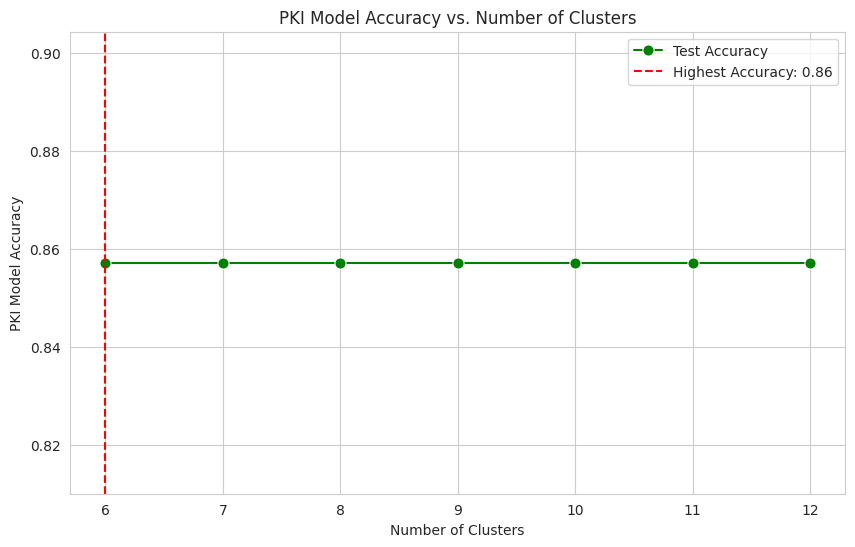

In [ ]:
cluster_sizes = [6, 7, 8, 9, 10, 11, 12]
accuracies = []
_,dim=x_train.shape

for sofm_structure in cluster_sizes:

    # Train the unsupervised SOFM model
    np.random.seed(0)
    model = SOM(m=r, n=r, dim=dim)
    model.fit(x_train_np)


    cluster_train = np.array(model.predict(x_train_np))
    cluster_val = np.array(model.predict(x_valid.to_numpy()))
    cluster_test = np.array(model.predict(x_test.to_numpy()))

    som_train_predicted_labels = map_clusters_to_labels(cluster_train, y_train)
    som_valid_predicted_labels = map_clusters_to_labels(cluster_val, y_valid)
    som_test_predicted_labels = map_clusters_to_labels(cluster_test, y_test)

    # One-hot encode the cluster labels for y_cluster_train
    y_train_encoded =  pd.get_dummies(y_train)
    y_test_encoded = pd.get_dummies(y_test)

    y_pki_train = pd.DataFrame({'Y_out_train': y_train, 'Y_cluster_train': som_train_predicted_labels})
    y_pki_val = pd.DataFrame({'Y_out_test': y_valid, 'Y_cluster_train': som_valid_predicted_labels})
    y_pki_test = pd.DataFrame({'Y_out_va;': y_test, 'Y_cluster_train': som_test_predicted_labels})
    # Create the PKI model
    _,dim2=y_pki_train.shape
    pki_model = PKI_model(dim2,30,4)
    pki_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss='mae', metrics=['accuracy'])
    pki_model.fit(y_pki_train, y_train_encoded, epochs=50,validation_data=(y_pki_val, y_valid), batch_size=32)
    loss, accuracy = pki_model.evaluate(y_pki_test, y_test_encoded)
    print(f"SOFM {sofm_structure}x{sofm_structure} -  Loss: {loss},  Accuracy: {accuracy}")
    accuracies.append(accuracy)


# Visualize the results using a line plot with Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x=cluster_sizes, y=accuracies, marker='o', markersize=8, color='green', label="Test Accuracy")
plt.xlabel("Number of Clusters")
plt.ylabel("PKI Model Accuracy")
plt.title("PKI Model Accuracy vs. Number of Clusters")

# Find the index of the highest accuracy
highest_accuracy_index = accuracies.index(max(accuracies))
# Find the corresponding number of clusters for the highest accuracy
highest_accuracy_clusters = cluster_sizes[highest_accuracy_index]

# Add a red dotted line for the highest accuracy
plt.axvline(highest_accuracy_clusters, color='red', linestyle='--', label=f"Highest Accuracy: {max(accuracies):.2f}")
plt.legend()
plt.grid(True)
plt.show()
plt.show()


Model: "sequential_76"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_482 (Dense)           (None, 30)                90        
                                                                 
 dense_483 (Dense)           (None, 30)                930       
                                                                 
 dense_484 (Dense)           (None, 1)                 31        
                                                                 
Total params: 1,051
Trainable params: 1,051
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
259/259 [==============================] - 4s 8ms/step - loss: 0.1553 - accuracy: 0.8571 - val_loss: 3.9732 - val_accuracy: 0.0000e+00
Epoch 2/50
259/259 [==============================] - 1s 2ms/step - loss: 0.1475 - accuracy: 0.8571 - val_loss: 3.9794 - val_accuracy: 0.0000e+00
Epoch 3/50
259/259 [===

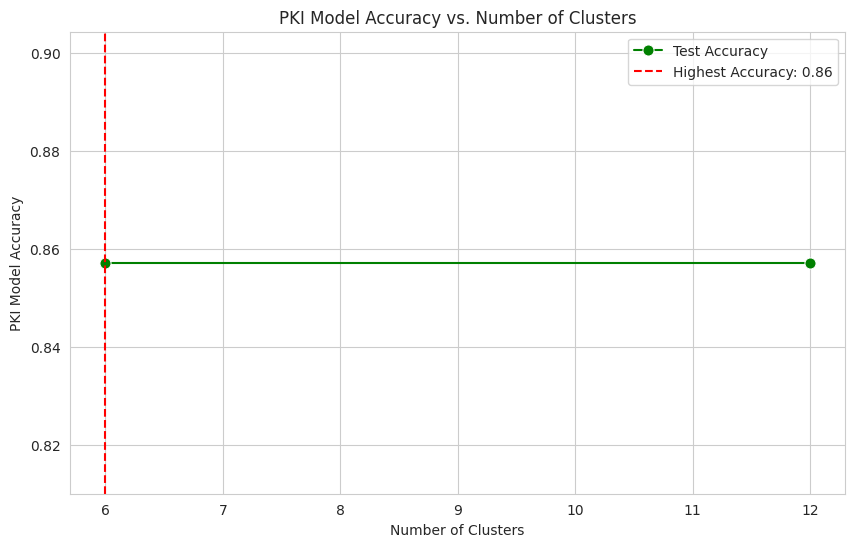

In [ ]:
cluster_sizes = [6,12]
accuracies = []
_,dim=x_train.shape

for sofm_structure in cluster_sizes:

    # Train the unsupervised SOFM model
    np.random.seed(0)
    model = SOM(m=r, n=r, dim=dim)
    model.fit(x_train_np)


    cluster_train = np.array(model.predict(x_train_np))
    cluster_val = np.array(model.predict(x_valid.to_numpy()))
    cluster_test = np.array(model.predict(x_test.to_numpy()))

    som_train_predicted_labels = map_clusters_to_labels(cluster_train, y_train)
    som_valid_predicted_labels = map_clusters_to_labels(cluster_val, y_valid)
    som_test_predicted_labels = map_clusters_to_labels(cluster_test, y_test)

    # One-hot encode the cluster labels for y_cluster_train
    y_train_encoded =  pd.get_dummies(y_train)
    y_test_encoded = pd.get_dummies(y_test)

    y_pki_train = pd.DataFrame({'Y_out_train': y_train, 'Y_cluster_train': som_train_predicted_labels})
    y_pki_val = pd.DataFrame({'Y_out_test': y_valid, 'Y_cluster_train': som_valid_predicted_labels})
    y_pki_test = pd.DataFrame({'Y_out_va;': y_test, 'Y_cluster_train': som_test_predicted_labels})
    # Create the PKI model
    _,dim2=y_pki_train.shape
    pki_model = PKI_model(dim2,30,2)
    pki_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss='mae', metrics=['accuracy'])
    pki_model.fit(y_pki_train, y_train_encoded, epochs=50,validation_data=(y_pki_val, y_valid), batch_size=32)
    loss, accuracy = pki_model.evaluate(y_pki_test, y_test_encoded)
    print(f"SOFM {sofm_structure}x{sofm_structure} -  Loss: {loss},  Accuracy: {accuracy}")
    accuracies.append(accuracy)


# Visualize the results using a line plot with Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x=cluster_sizes, y=accuracies, marker='o', markersize=8, color='green', label="Test Accuracy")
plt.xlabel("Number of Clusters")
plt.ylabel("PKI Model Accuracy")
plt.title("PKI Model Accuracy vs. Number of Clusters")

# Find the index of the highest accuracy
highest_accuracy_index = accuracies.index(max(accuracies))
# Find the corresponding number of clusters for the highest accuracy
highest_accuracy_clusters = cluster_sizes[highest_accuracy_index]

# Add a red dotted line for the highest accuracy
plt.axvline(highest_accuracy_clusters, color='red', linestyle='--', label=f"Highest Accuracy: {max(accuracies):.2f}")
plt.legend()
plt.grid(True)
plt.show()
plt.show()


Model: "sequential_68"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_442 (Dense)           (None, 10)                30        
                                                                 
 dense_443 (Dense)           (None, 10)                110       
                                                                 
 dense_444 (Dense)           (None, 10)                110       
                                                                 
 dense_445 (Dense)           (None, 10)                110       
                                                                 
 dense_446 (Dense)           (None, 1)                 11        
                                                                 
Total params: 371
Trainable params: 371
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
259/259 [==============================] - 2

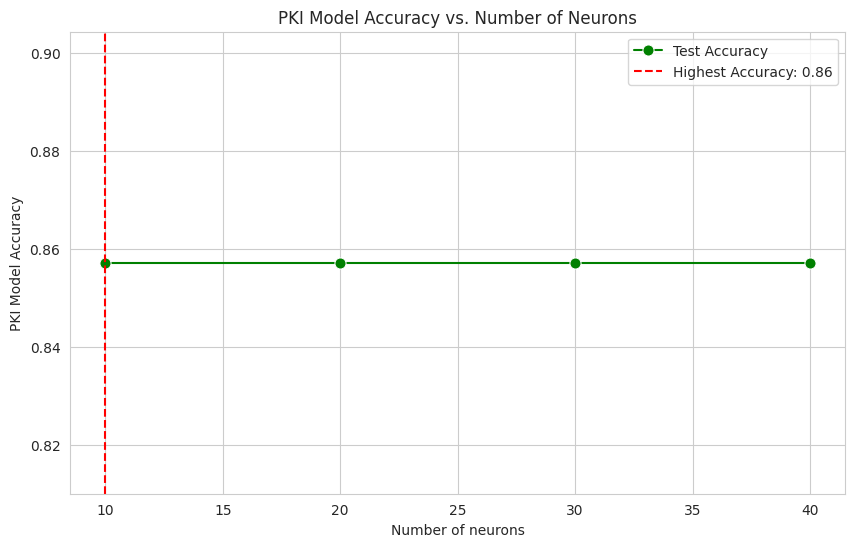

In [ ]:
cluster_sizes = [6]
accuracies = []
_,dim=x_train.shape

for sofm_structure in cluster_sizes:

    # Train the unsupervised SOFM model
    np.random.seed(0)
    model = SOM(m=r, n=r, dim=dim)
    model.fit(x_train_np)


    cluster_train = np.array(model.predict(x_train_np))
    cluster_val = np.array(model.predict(x_valid.to_numpy()))
    cluster_test = np.array(model.predict(x_test.to_numpy()))

    som_train_predicted_labels = map_clusters_to_labels(cluster_train, y_train)
    som_valid_predicted_labels = map_clusters_to_labels(cluster_val, y_valid)
    som_test_predicted_labels = map_clusters_to_labels(cluster_test, y_test)

    # One-hot encode the cluster labels for y_cluster_train
    y_train_encoded =  pd.get_dummies(y_train)
    y_test_encoded = pd.get_dummies(y_test)

    y_pki_train = pd.DataFrame({'Y_out_train': y_train, 'Y_cluster_train': som_train_predicted_labels})
    y_pki_val = pd.DataFrame({'Y_out_test': y_valid, 'Y_cluster_train': som_valid_predicted_labels})
    y_pki_test = pd.DataFrame({'Y_out_va;': y_test, 'Y_cluster_train': som_test_predicted_labels})
    # Create the PKI model
    _,dim2=y_pki_train.shape
    neurons=[10,20,30,40]
    dnn_acc=[]
    for i in neurons:
      pki_model = PKI_model(dim2,i,4)
      pki_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss='mae', metrics=['accuracy'])
      pki_model.fit(y_pki_train, y_train_encoded, epochs=50,validation_data=(y_pki_val, y_valid), batch_size=32)
      loss, accuracy = pki_model.evaluate(y_pki_test, y_test_encoded)
      accuracies.append(accuracy)
highest_accuracy_index = accuracies.index(max(accuracies))
# Find the corresponding number of clusters for the highest accuracy
highest_accuracy_clusters = neurons[highest_accuracy_index]
plt.figure(figsize=(10, 6))
sns.lineplot(x=neurons, y=accuracies, marker='o', markersize=8, color='green', label="Test Accuracy")
plt.axvline(highest_accuracy_clusters, color='red', linestyle='--', label=f"Highest Accuracy: {max(accuracies):.2f}")
plt.xlabel("Number of neurons")
plt.ylabel("PKI Model Accuracy")
plt.title("PKI Model Accuracy vs. Number of Neurons")
plt.legend()
plt.grid(True)
plt.show()

Model: "sequential_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_407 (Dense)           (None, 30)                90        
                                                                 
 dense_408 (Dense)           (None, 30)                930       
                                                                 
 dense_409 (Dense)           (None, 1)                 31        
                                                                 
Total params: 1,051
Trainable params: 1,051
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
259/259 [==============================] - 2s 3ms/step - loss: 0.1748 - accuracy: 0.8571 - val_loss: 3.9833 - val_accuracy: 0.0000e+00
Epoch 2/50
259/259 [==============================] - 1s 3ms/step - loss: 0.1519 - accuracy: 0.8571 - val_loss: 3.9822 - val_accuracy: 0.0000e+00
Epoch 3/50
259/259 [===

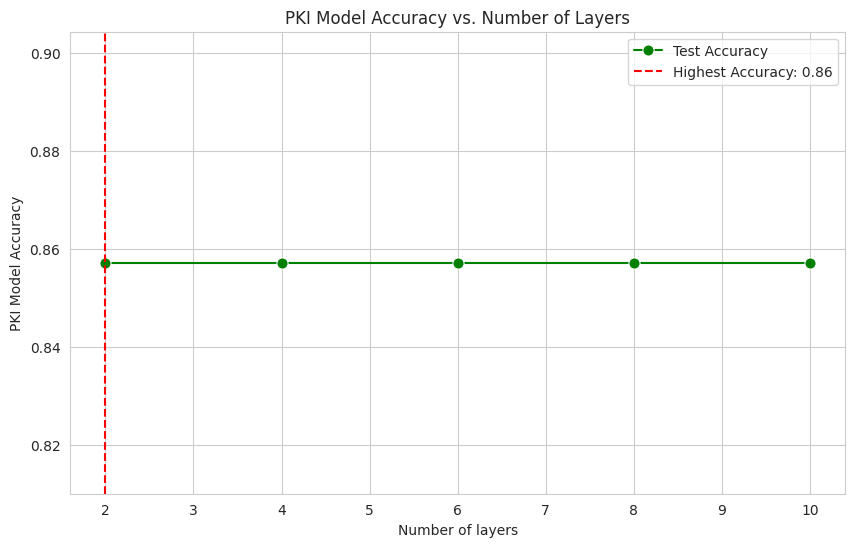

In [ ]:
cluster_sizes = [6]
accuracies = []
_,dim=x_train.shape

for sofm_structure in cluster_sizes:

    # Train the unsupervised SOFM model
    np.random.seed(0)
    model = SOM(m=r, n=r, dim=dim)
    model.fit(x_train_np)


    cluster_train = np.array(model.predict(x_train_np))
    cluster_val = np.array(model.predict(x_valid.to_numpy()))
    cluster_test = np.array(model.predict(x_test.to_numpy()))

    som_train_predicted_labels = map_clusters_to_labels(cluster_train, y_train)
    som_valid_predicted_labels = map_clusters_to_labels(cluster_val, y_valid)
    som_test_predicted_labels = map_clusters_to_labels(cluster_test, y_test)

    # One-hot encode the cluster labels for y_cluster_train
    y_train_encoded =  pd.get_dummies(y_train)
    y_test_encoded = pd.get_dummies(y_test)

    y_pki_train = pd.DataFrame({'Y_out_train': y_train, 'Y_cluster_train': som_train_predicted_labels})
    y_pki_val = pd.DataFrame({'Y_out_test': y_valid, 'Y_cluster_train': som_valid_predicted_labels})
    y_pki_test = pd.DataFrame({'Y_out_va;': y_test, 'Y_cluster_train': som_test_predicted_labels})
    # Create the PKI model
    _,dim2=y_pki_train.shape
    layers=[2,4,6,8,10]
    dnn_acc=[]
    for i in layers:
      pki_model = PKI_model(dim2,30,i)
      pki_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss='mae', metrics=['accuracy'])
      pki_model.fit(y_pki_train, y_train_encoded, epochs=50,validation_data=(y_pki_val, y_valid), batch_size=32)
      loss, accuracy = pki_model.evaluate(y_pki_test, y_test_encoded)
      accuracies.append(accuracy)
highest_accuracy_index = accuracies.index(max(accuracies))
# Find the corresponding number of clusters for the highest accuracy
highest_accuracy_clusters = layers[highest_accuracy_index]
plt.figure(figsize=(10, 6))
sns.lineplot(x=layers, y=accuracies, marker='o', markersize=8, color='green', label="Test Accuracy")
plt.axvline(highest_accuracy_clusters, color='red', linestyle='--', label=f"Highest Accuracy: {max(accuracies):.2f}")
plt.xlabel("Number of layers")
plt.ylabel("PKI Model Accuracy")
plt.title("PKI Model Accuracy vs. Number of Layers")
plt.legend()
plt.show()